# Постановка задачи

### Задача

- Сегментация клиентов банка для понимания своей аудитории

### Описание данных

**Источник данных:** https://www.kaggle.com/uciml/german-credit

**Описание признаков**

- Age (numeric)
- Sex (text: male, female)
- Job (numeric: 0 - unskilled and non-resident, 1 - unskilled and resident, 2 - skilled, 3 - highly skilled)
- Housing (text: own, rent, or free)
- Saving accounts (text - little, moderate, quite rich, rich)
- Checking account (numeric, in DM - Deutsch Mark)
- Credit amount (numeric, in DM)
- Duration (numeric, in month)
- Purpose (text: car, furniture/equipment, radio/TV, domestic appliances, repairs, education, business, vacation/others)

**Описание датасета:**
The original dataset contains 1000 entries with 20 categorial/symbolic attributes prepared by Prof. Hofmann. In this dataset, each entry represents a person who takes a credit by a bank. Each person is classified as good or bad credit risks according to the set of attributes. The link to the original dataset can be found below.

In [1]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
pd.set_option("display.max_columns", 50)

import numpy as np

import seaborn as sns
sns.set_style("darkgrid")  
sns.set_context("talk", font_scale=0.6)

import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams.update(
    {"lines.linewidth": 1, "patch.facecolor": "#ebe3df", "axes.facecolor": "#ebe3df"})

from tqdm import tqdm

import math

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder

# <font color=#0b5bdb> Загрузка данных

In [2]:
df = pd.read_csv('../data/raw/german_credit_data.csv', index_col=None)
display(df.head())
display(df.tail())

,Unnamed: 0,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
0,0,67,male,2,own,NaN,little,1169,6,radio/TV
1,1,22,female,2,own,little,moderate,5951,48,radio/TV
2,2,49,male,1,own,little,NaN,2096,12,education
3,3,45,male,2,free,little,little,7882,42,furniture/equipment
4,4,53,male,2,free,little,little,4870,24,car


,Unnamed: 0,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
995,995,31,female,1,own,little,NaN,1736,12,furniture/equipment
996,996,40,male,3,own,little,little,3857,30,car
997,997,38,male,2,own,little,NaN,804,12,radio/TV
998,998,23,male,2,free,little,little,1845,45,radio/TV
999,999,27,male,2,own,moderate,moderate,4576,45,car


 - Данные загрузились успешно
 - Признак **Unnamed: 0** является ID и не несет информационной ценнности в рамках задачи - можно удалить

In [9]:
df.drop(columns=['Unnamed: 0'], inplace=True)

# <font color=#0b5bdb> 1. General view

## <font color=#0b5bdb>1.1 Типы данных

In [10]:
# Реализовать как функцию
def display_dtypes(df):
    df_local = df
    df_tmp = df_local#[[i for i in df_local.columns if 'datetime' in i]]

    # Обзор намеков на типы признаков
    unique_values = df_tmp.nunique().sort_values(ascending=False)
    unique_values = pd.DataFrame(unique_values, columns = ['Колич. уник. значений'])

    # Довать процентовку
    unique_values['Доля в %'] = (unique_values['Колич. уник. значений']/df_tmp.shape[0])*100
    unique_values = pd.concat([unique_values, pd.DataFrame(df_tmp.dtypes, columns=['dtype'])], axis=1) 
    display(unique_values)
    
display_dtypes(df)

,Колич. уник. значений,Доля в %,dtype
Credit amount,921,92.1,int64
Age,53,5.3,int64
Duration,33,3.3,int64
Purpose,8,0.8,object
Job,4,0.4,int64
Saving accounts,4,0.4,object
Housing,3,0.3,object
Checking account,3,0.3,object
Sex,2,0.2,object


 - **Job** потенциально выглядит категориальным признаком. int -> object;
 - **Checking account** по описанию д.б. numeric

Для удобства дальнейшего исследования преобразуем **Job** к категориальному типу

In [11]:
# Преобразование int -> object
df['Job'] = df['Job'].astype('str')

Посмотрим на **Checking account**

In [12]:
df['Checking account'].unique()

array(['little', 'moderate', nan, 'rich'], dtype=object)

**Заключение**
 - **Checking account** содержит явно категориальные признаки


## <font color=#0b5bdb> 1.2. Проверка наличия дыр в данных

In [13]:
import missingno as msno


# Процентный список пропущенных значений
def scan_miss_val(df: pd.DataFrame) -> pd.DataFrame:
    '''
    :param df:
    :return: На выходе столбец значений =(% NAN) в признаке.
    '''
    # ___init___
    miss_val_df = pd.DataFrame()
    NA_present = 0

    # Обработка каждого столбца отдельно
    for col in df.columns:
        pct_missing = np.mean(df[col].isnull())
        temp = pd.DataFrame([round(pct_missing * 100)], columns=['% miss'], index=[col])
        temp['cnt'] = df[col].isnull().sum()

        miss_val_df = pd.concat([miss_val_df, temp], axis=0)

        if (pct_missing != 0) & (NA_present == 0):
            NA_present = NA_present + 1

    # Построение Тепловой карты пропущенных значений
    if NA_present != 0:
        msno.matrix(df, labels=True, sort="descending")

    return miss_val_df.sort_values(by='% miss')

,% miss,cnt
Age,0,0
Sex,0,0
Job,0,0
Housing,0,0
Credit amount,0,0
Duration,0,0
Purpose,0,0
Saving accounts,18,183
Checking account,39,394


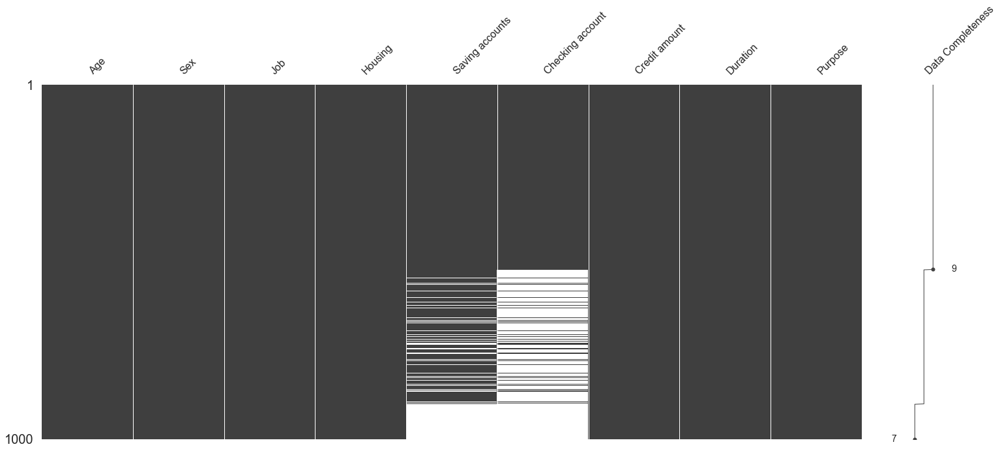

In [14]:
scan_miss_val(df)

**Анализ**
 - имеется дыра в данных по признакам **Saving accounts** и **Checking account**
 - у признака **Checking account** 39% пропущенных значений

**Посмотрим на дыру в данных**

In [15]:
hole_df = df[df.isnull().sum(axis=1)>1]
hole_df
# Для анализа будет удобно ппостроить аналитический df

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
5,35,male,1,free,NaN,NaN,9055,36,education
16,53,male,2,own,NaN,NaN,2424,24,radio/TV
24,26,male,2,own,NaN,NaN,2069,10,furniture/equipment
33,57,male,1,rent,NaN,NaN,1264,12,business
53,31,male,2,own,NaN,NaN,3378,18,car
...,...,...,...,...,...,...,...,...,...
947,38,male,3,own,NaN,NaN,2859,12,car
962,29,male,2,own,NaN,NaN,3556,15,car
968,29,male,2,rent,NaN,NaN,7166,42,radio/TV
990,37,male,1,own,NaN,NaN,3565,12,education


In [16]:
# Посмотрим статистики данных вокруг дыры
display(hole_df.describe().loc[['min', '50%', 'max']])
display(hole_df.describe(include=object).loc[['unique']])

,Age,Credit amount,Duration
min,20.0,700.0,6.0
50%,37.0,3074.0,21.0
max,68.0,13756.0,60.0


,Sex,Job,Housing,Saving accounts,Checking account,Purpose
unique,2,3,3,0,0,7


**Анализ**
 - **Saving accounts** и **Checking account** являются категориальными и Nan является признаком отсутствия открытого счета того или иного типа. Дыра в данных, вероятно, является признаком отедбной группы клиентов, у которых нет открытых счетов в банке, но взявших кредит

## <font color=#0b5bdb> 1.3. Области допустимых значений признаков (поиск ошибок в данных)

### <font color=#0b5bdb> 1.3.1 Числовые признаки

In [17]:
df.describe().drop(['count', 'std', 'mean'], axis=0)

,Age,Credit amount,Duration
min,19.0,250.00,4.0
25%,27.0,1365.50,12.0
50%,33.0,2319.50,18.0
75%,42.0,3972.25,24.0
max,75.0,18424.00,72.0


 - **Age** = [18, 100]. Текущие значения укладываются в область.
 - **Credit amount** = [1,inf]. Текущие значения укладываются в область.
 - **Duration** = [0,inf]. Текущие значения укладываются в область.
 
 
 
 **Заключение**
  - Таким образом, в данных отсутствуют явные ошибки в значениях
  - Все признаки в разных масштабах.
  - Все числовые признаки репрезентативны (представлены во всей области определения)

### <font color=#0b5bdb> 1.3.2 Категориальные признаки

In [18]:
def get_unique(dataframe: pd.DataFrame):
    cat_cols = dataframe.select_dtypes(exclude="number")
    uni_values = []
    counts=[]

    for col in cat_cols.columns:
        uni_value, count = np.unique(
            np.array(cat_cols[col], dtype=str), return_counts=True
        )
        uni_values.append(uni_value)
        counts.append(count)

        
    result = pd.DataFrame(
        {
            "dtype": cat_cols.dtypes,
            "unique_values": uni_values,
            "counts": [len(val) for val in uni_values],
        } )
    cm = sns.light_palette('orange', as_cmap=True)
    result = result.style.background_gradient( cmap=cm, axis=0, subset=['counts'], vmin = 3)
    
    return result

In [19]:
get_unique(df)

,dtype,unique_values,counts
Sex,object,['female' 'male'],2
Job,object,['0' '1' '2' '3'],4
Housing,object,['free' 'own' 'rent'],3
Saving accounts,object,['little' 'moderate' 'nan' 'quite rich' 'rich'],5
Checking account,object,['little' 'moderate' 'nan' 'rich'],4
Purpose,object,['business' 'car' 'domestic appliances' 'education' 'furniture/equipment' 'radio/TV' 'repairs' 'vacation/others'],8


In [20]:
df['Purpose'].unique().tolist()

['radio/TV',
 'education',
 'furniture/equipment',
 'car',
 'business',
 'domestic appliances',
 'repairs',
 'vacation/others']

**Заключение**
 - В категориальных данных отстуствуют явные ошибочные значения. Все категории из допустимой области значений

## <font color=#0b5bdb> 1.4 Наличие дубликатов </font>

In [21]:
# Сканирование на наличие дубликатов
columns_to_concider = df.columns
df_duplicated = df.duplicated(subset=columns_to_concider)

n_duplicates = df_duplicated.sum()
print('Number of duplicates = ', n_duplicates)

display(df[df_duplicated==True])

Number of duplicates =  0


,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose


**Заключение**
- В данных отсутствуют полные дубликаты объектов

# <font color=#0b5bdb> 2. EDA

## <font color=#0b5bdb> 2.1 Target view

В данных отсутствует целевой признак

## <font color=#0b5bdb> 2.2 Числовые признаки

In [22]:
numeric_cols = list(df.select_dtypes(include=[np.number]).columns)
display(numeric_cols)

['Age', 'Credit amount', 'Duration']

### <font color=#0b5bdb> 2.2.1 Univariate FA

<font color=#0b5bdb> **Анализ распределений**

In [23]:
def plot_numUFA(df: pd.DataFrame, num_columns: list=None):
    
    assert num_columns!=None, 'Не передан список числовых признаков'

    skewness_list = df[num_columns].skew()
    
    subplot_cnt = len(num_columns)*3
    
    
    n_col = 3
    if len(num_columns) <= n_col/3:
        n_col = 3
        n_row = 1
    else:
        n_row = math.ceil(subplot_cnt / n_col)
    

    fig, axes = plt.subplots(
        nrows=n_row,
        ncols=n_col,
        figsize=(n_col * 6, n_row * 6),
        gridspec_kw={"hspace": 0.4, "wspace": 0.2, "width_ratios": [0.8, 0.5, 1]},
    )
    axes = axes.flatten()
    i = 0
    for column in tqdm(num_columns):

         # __Распределение__
        ax = axes[i]
        sns.kdeplot(data=df, 
                    x=column, 
                    ax=ax, 
                    fill=False, 
                    alpha=0.9, 
                    legend=False, 
                    linewidth=3, 
                    palette = 'Set2',
                   )

        skewness = skewness_list[column]
        ax.text(
            ax.get_xlim()[0],
            ax.get_ylim()[-1],
            f"skew: {skewness:.2f}",
            size=12,
            weight="bold",
        )
        i = i+1



        #__Бокс__
        ax = axes[i]
        sns.boxplot(
            data=df,
            #x="Churn",
            y=column,
            ax=ax,
            width=0.6,
            saturation=0.9,
            linewidth=0.9,
            palette='Set2',
        )

        i =i + 1



        # __Монотонность__
        df_local = df.copy()
        df_local = df_local.sort_values(by=column).reset_index(drop=True)
        ax = axes[i]
        sns.scatterplot(
            data=df_local, x=df_local.index, y=column,alpha=1, ax=ax, color='b', palette='Set2'
        )
        i = i+1

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  7.82it/s]


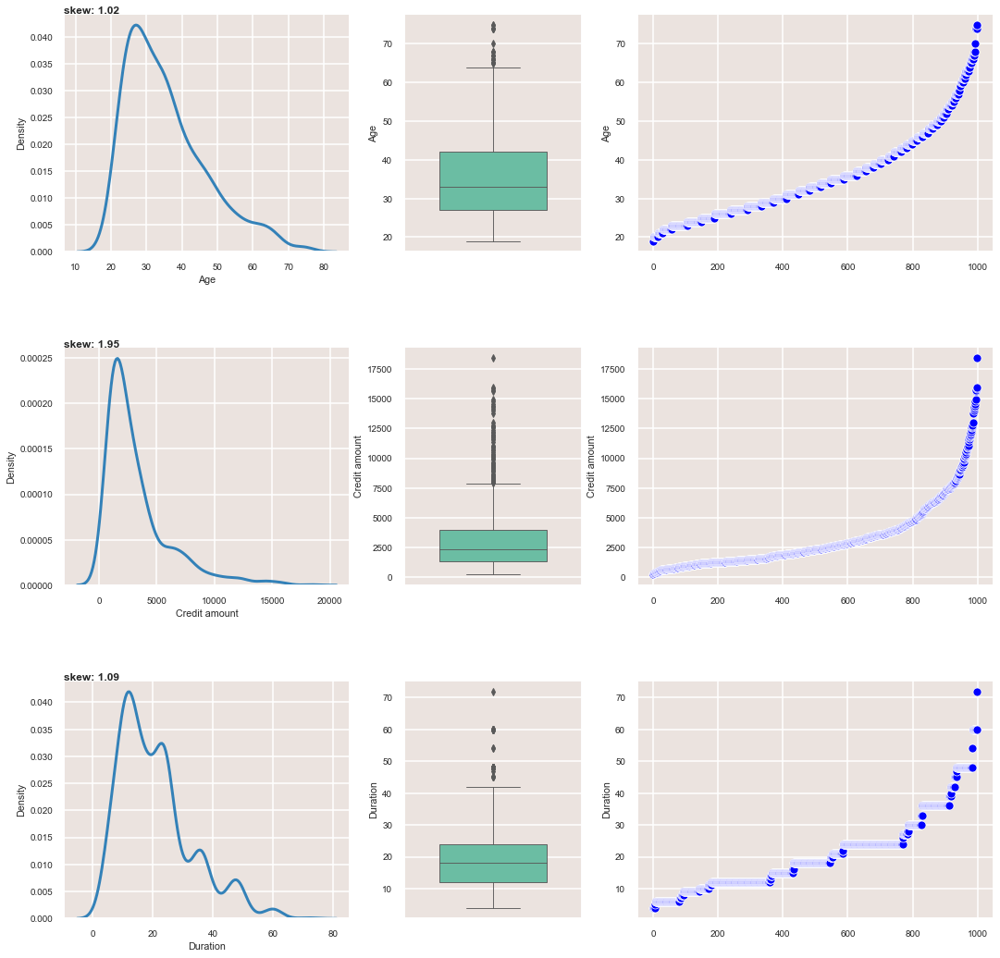

In [24]:
plot_numUFA(df, num_columns=numeric_cols)

***1. Качество распределений***
 - У всех числовых признаков явный скос распределений.
 
 
***2. Выбросы***
 - У всех признаков длинные хвосты и большое количество выбросов в смысле IQR.
 - *TotalCharges* имеет длинный хвост, но отсутствует явный разрыв значений.
 
 
***3. Монотонность***
 - У признаков **Age** и **Credit Amount** имею разрыв только в конце хвоста.
 - У признака **Duration** прослеживается дискретизация значений. Имеются разрывы в хвосте.
 

***4. Идеи***
 - Для признаков есть причины провести логарифмирование для сдвига шкалы.

#### <font color=#0b5bdb> ___Age

In [188]:
from sklearn.preprocessing import PowerTransformer

def plot_bestNorm_transf(df: pd.DataFrame, column_name: str):
    df_local = df[[column_name]].copy()
    
    # применяем преобразование Йео–Джонсона
    power = PowerTransformer(method='yeo-johnson', standardize=False)
    power.fit(df_local)
    df_local[f'tr({column_name})'] = power.transform(df_local)
    
    print(f'Преобразование признака {column_name}:')
    print(f'lambda = {power.lambdas_[0]}:')
    print(f"Скос:    {df_local[column_name].skew().round(3)} -> {df_local[f'tr({column_name})'].skew().round(3)}")
    print(f"Эксцесс: {df_local[column_name].kurtosis().round(3)} -> {df_local[f'tr({column_name})'].kurtosis().round(3)}")
    
    plot_numUFA(df_local, num_columns=list(df_local.columns))

In [190]:
from sklearn.preprocessing import PowerTransformer

def get_bestNorm_transf(df: pd.DataFrame, column_name: str):
    df_local = df[[column_name]].copy()
    
    # применяем преобразование Йео–Джонсона
    power = PowerTransformer(method='yeo-johnson', standardize=False)
    power.fit(df_local)
    df_local[f'tr({column_name})'] = power.transform(df_local)
    
    print(f'Преобразование признака {column_name}:')
    print(f'lambda = {power.lambdas_[0]}:')
    print(f"Скос:    {df_local[column_name].skew().round(3)} -> {df_local[f'tr({column_name})'].skew().round(3)}")
    print(f"Эксцесс: {df_local[column_name].kurtosis().round(3)} -> {df_local[f'tr({column_name})'].kurtosis().round(3)}")
    
    return df_local[f'tr({column_name})']

Преобразование признака Age:
lambda = -0.7026098151384275:
Скос:    1.021 -> 0.056
Эксцесс: 0.596 -> -0.805


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  6.86it/s]


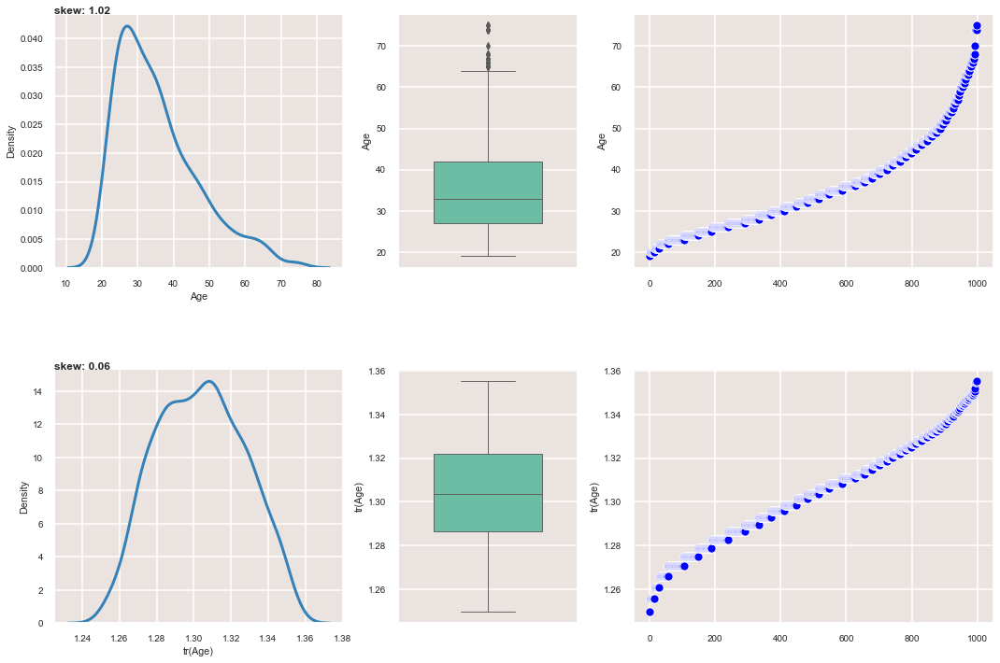

In [189]:
plot_bestNorm_transf(df, column_name='Age')

***Заключение***
- применение трансформации признака **Age** значительно улучшает качество распределений:
    1. Значительно уменьшается смещение. Убирается длинных хвост.
    2. Пропадают выбросы в смысле IQR

#### <font color=#0b5bdb> ___Credit Amount

Преобразование признака Credit amount:
Скос:    1.95 -> 0.005
Эксцесс: 4.293 -> -0.305


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  7.82it/s]


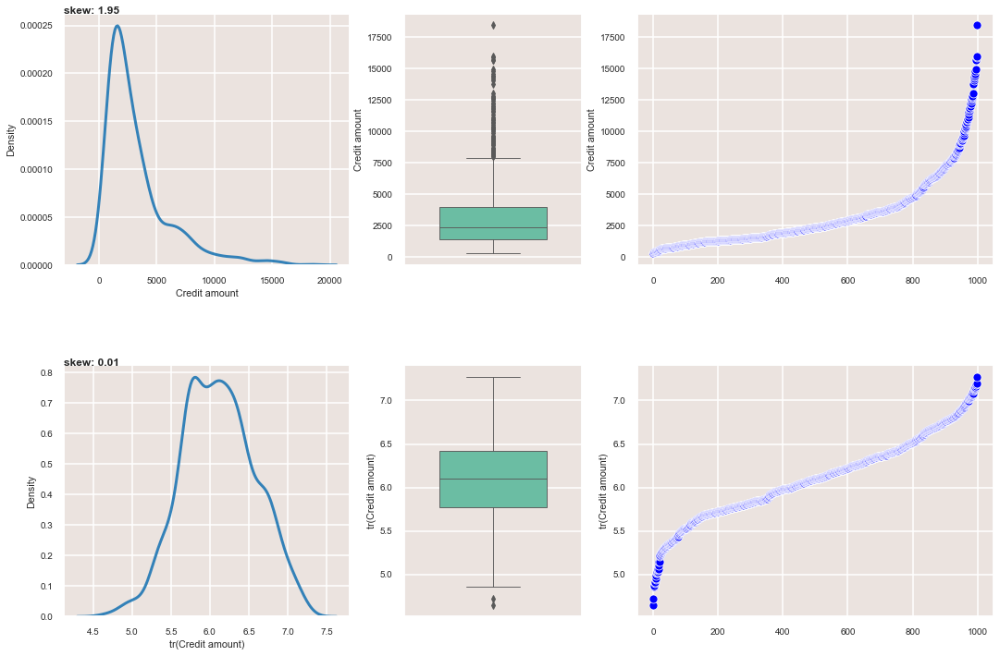

In [145]:
plot_bestNorm_transf(df, column_name='Credit amount')

***Заключение***
- применение трансформации признака **Credit amount** значительно улучшает качество распределений:
    1. Значительно уменьшается смещение. Убирается длинных хвост.
    2. Большинство выбросов в смысле IQR пропадают. Появляется выброс в 0

#### <font color=#0b5bdb> ___Duration

Преобразование признака Duration:
Скос:    1.094 -> -0.004
Эксцесс: 0.92 -> -0.586


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  8.55it/s]


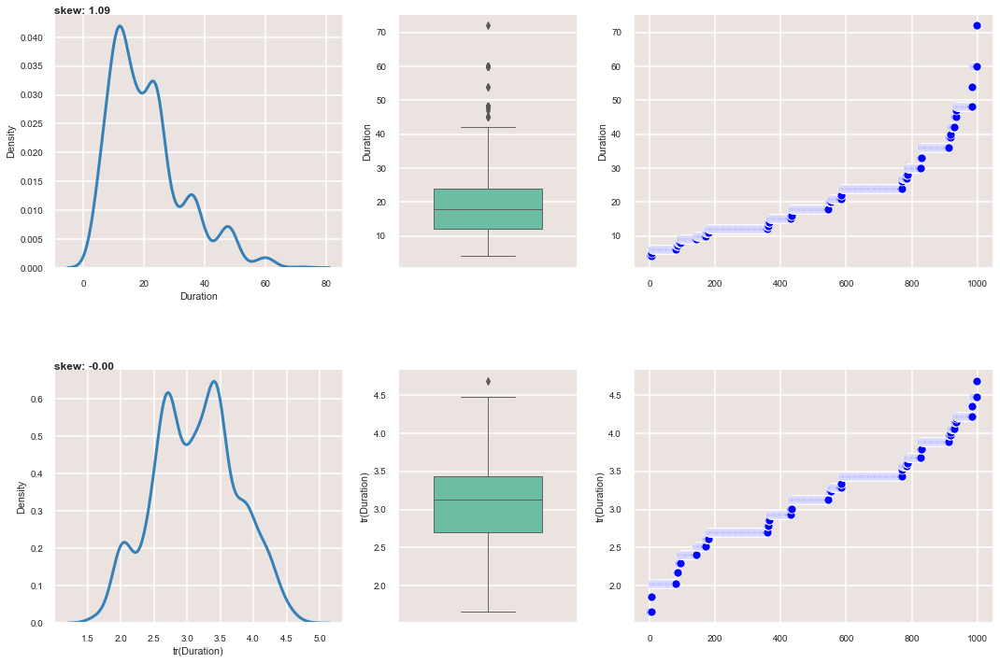

In [146]:
plot_bestNorm_transf(df, column_name='Duration')

***Заключение***
- применение трансформации признака **Duration** значительно улучшает качество распределений:
    1. Значительно уменьшается смещение. Убирается длинных хвост.
    2. Большинство выбросов в смысле IQR пропадают. Появляется выбросы в крайних значениях хвостов

<font color=#0b5bdb> **Преобразование шкал**

Преобразование признака Age:
lambda = -0.7026098151384275:
Скос:    1.021 -> 0.056
Эксцесс: 0.596 -> -0.805
Преобразование признака Duration:
lambda = 0.04045941745472809:
Скос:    1.094 -> -0.004
Эксцесс: 0.92 -> -0.586
Преобразование признака Credit amount:
lambda = -0.06457868809151723:
Скос:    1.95 -> 0.005
Эксцесс: 4.293 -> -0.305


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  8.96it/s]


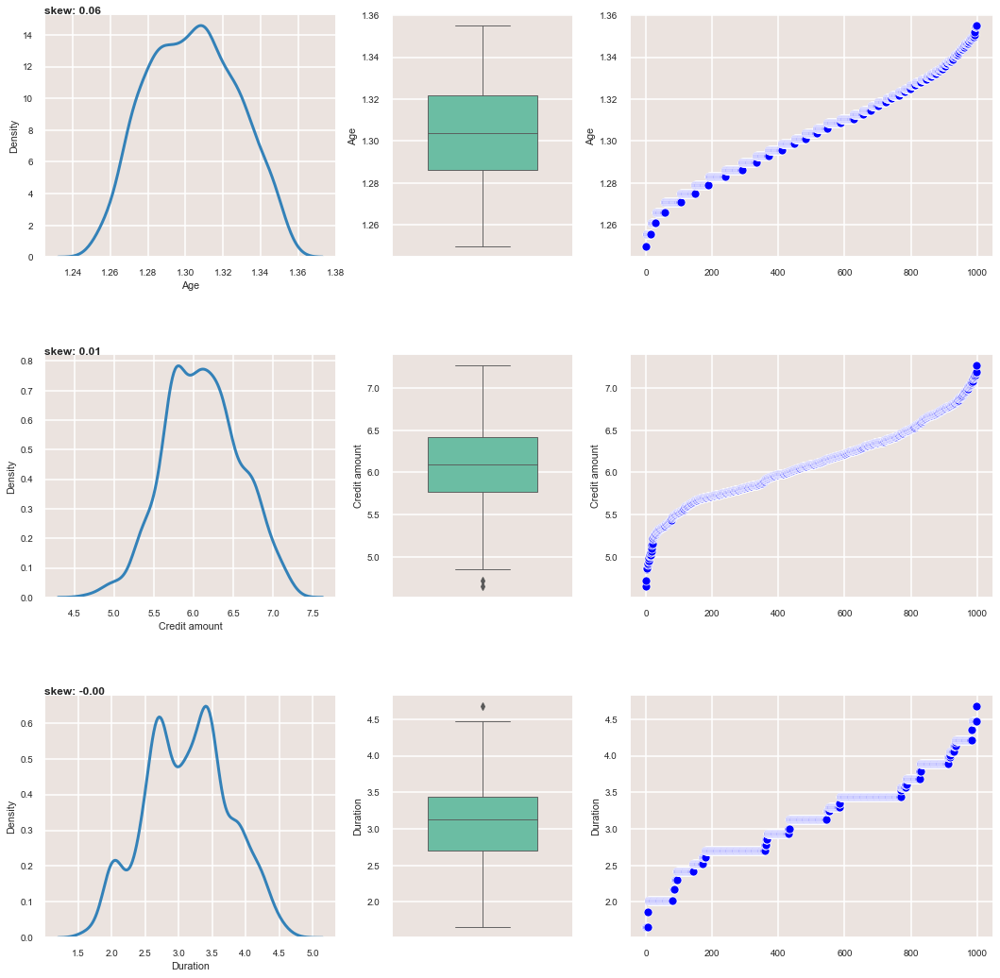

In [192]:
df_num_norm = df[numeric_cols].copy()

for col in ['Age', 'Duration', 'Credit amount']:
    column_name = col
    df_num_norm[column_name] = get_bestNorm_transf(df_num_norm, col)
    
plot_numUFA(df_num_norm, num_columns=list(df_num_norm.columns))

<font color=#0b5bdb> **Анализ пропущенных значений**

In [193]:
scan_miss_val(df_num_norm)

,% miss,cnt
Age,0,0
Credit amount,0,0
Duration,0,0


### <font color=#0b5bdb> 2.2.2 Bivariate numFA

<font color=#0b5bdb> **Визуальный анализ**

In [194]:
def my_subplots(subplot_cnt: int, n_col: int = 3):
    '''
    Построение грид графиков.
    Кол-во строк определяется автоматически
    :param subplot_cnt: Список графиков
    :param n_col: int = 3 Количество столбцов
    :return: fig, ax: list
    '''

    # ___Step_1___
    # Определение кол. строк и столбцов
    if subplot_cnt <= n_col:
        n_col = subplot_cnt
        n_row = 1
    else:
        n_row = math.ceil(subplot_cnt / n_col)

    # ___Step_2___
    # Построение графика
    fig, ax = plt.subplots(n_row, n_col, figsize=(n_col * 6, n_row * 6), gridspec_kw={"hspace": 0.4, "wspace": 0.2})
    if n_row > 1:
        ax = ax.reshape(ax.shape[0] * ax.shape[1], )
    if subplot_cnt == 1:
        # Создание итерабельного объекта
        ax = [ax]

    return fig, ax

In [195]:
def my_pairplot (data, type_prm = 'scatter'):
    feature_list = list(data.columns)
    
    pairs_list = []
    used_features = []
    
    for i in feature_list:
        used_features.append(i)
        for j in feature_list:
            if j not in used_features:
                pairs_list.append((i,j))
                
    if (type_prm == 'scatter'):
        figure, axes = my_subplots(subplot_cnt=len(data.columns))
        
        for idx, ax in enumerate (axes):
            if idx < len(pairs_list):
                sns.scatterplot(x=pairs_list[idx][0], y=pairs_list[idx][1], data=data, ax=ax, palette='Set2')

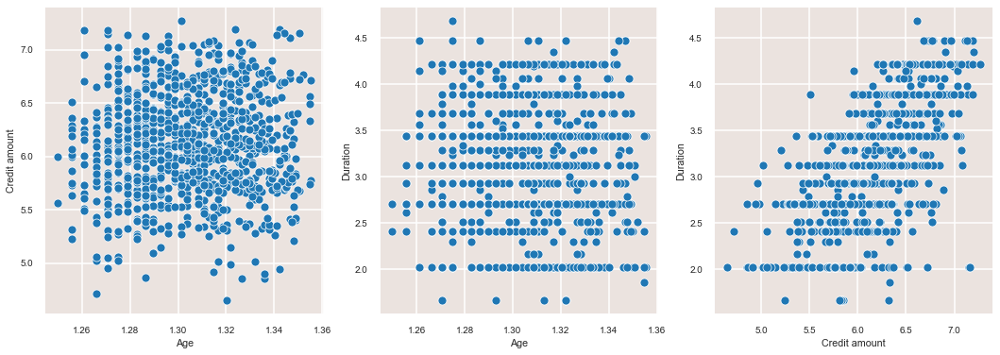

In [197]:
my_pairplot(df_num_norm)

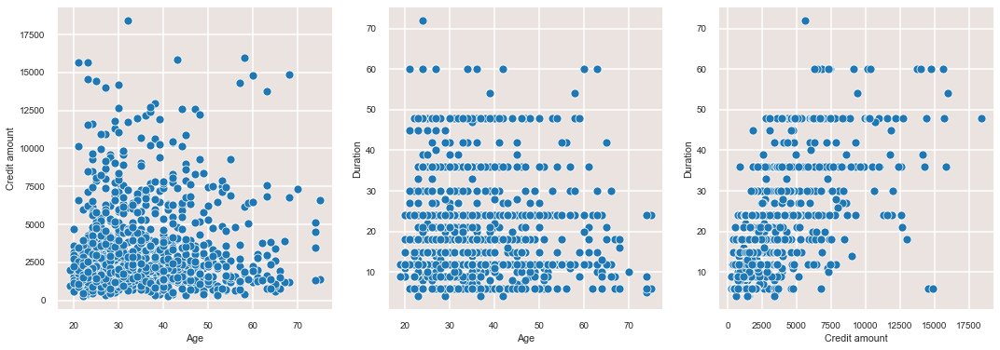

In [28]:
my_pairplot(df[numeric_cols])

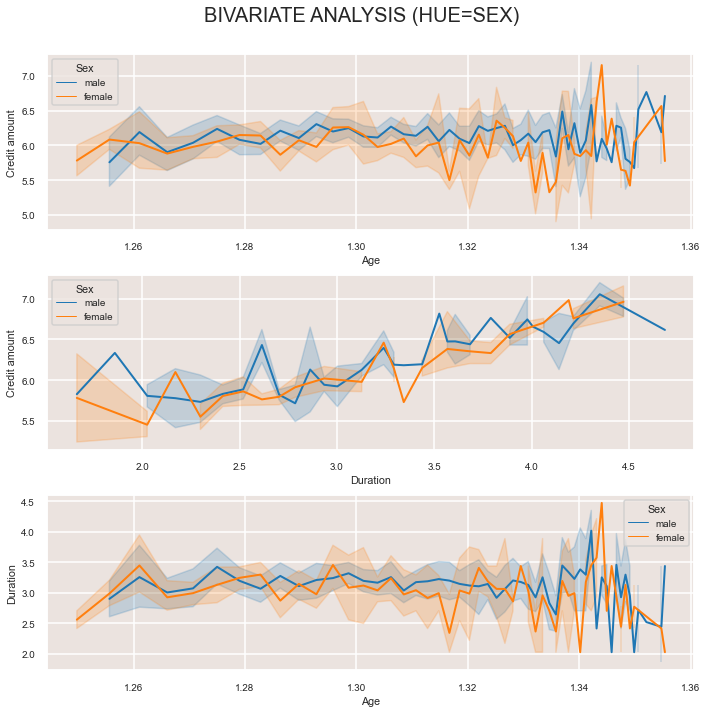

In [198]:
fig, ax = plt.subplots(3,1,figsize=(10,10))
plt.suptitle('BIVARIATE ANALYSIS (HUE=SEX)', fontsize=20)
plt.tight_layout(pad=2)

sns.lineplot(data=df_num_norm, x='Age',      y='Credit amount',      hue=df['Sex'], lw=2, ax=ax[0]);
sns.lineplot(data=df_num_norm, x='Duration', y='Credit amount',      hue=df['Sex'], lw=2, ax=ax[1]);
sns.lineplot(data=df_num_norm, x='Age',      y='Duration',           hue=df['Sex'], lw=2, ax=ax[2]);


***1. Наблюдения***
- Имеются намеки на наличие зависимости между признаками:
   - **Duration** и **Credit amount**

<font color=#0b5bdb> **Статистический анализ**

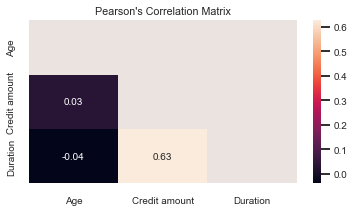

In [199]:
corr = df_num_norm.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(6, 3))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", linecolor="c")
plt.title("Pearson's Correlation Matrix")
plt.show()

 **1. Наличие линейной корреляции**
 - наблюдаем наличие лин. корреляции между признаками **Duration** и **Credit amount**, что совпадает с ранее сделанными выводами. Однако она не столь значительна

## <font color=#0b5bdb> 2.3 Категориальные признаки

In [200]:
cat_columns = list(df.select_dtypes(exclude="number"))
display(cat_columns)

['Sex', 'Job', 'Housing', 'Saving accounts', 'Checking account', 'Purpose']

### <font color=#0b5bdb>2.3.1 Univariate catFA

<font color=#0b5bdb> **Анализ балансов классов**

In [201]:
def get_catFA(dataframe: pd.DataFrame, short=False):
    cat_cols = dataframe.select_dtypes(exclude="number")
    uni_values = []
    counts = []
    pct = []
    balance_rate = []

    for col in cat_cols.columns:
        uni_value, count = np.unique(
            np.array(cat_cols[col], dtype=str), return_counts=True
        )
        uni_values.append(uni_value)
        counts.append(count)
        pct.append(np.round(count / count.sum() * 100, 2))
        balance_rate.append(100 - min(np.round(count / count.sum() * 100, 2))*len(count))
    
    if short is False:
        result = pd.DataFrame(
            {
                "dtype": cat_cols.dtypes,
                "unique_values": uni_values,
                "counts": [len(val) for val in uni_values],
                "values_count": counts,
                "%": pct,
                'imbalance_rate': balance_rate
            } )
        result = result.sort_values(by='imbalance_rate', ascending=False)
        cm = sns.light_palette('orange', as_cmap=True)
        result = result.style.background_gradient( cmap=cm, axis=0, subset=['imbalance_rate'], vmin=20)
    
    if short is True:
         result = pd.DataFrame(
            {
                "dtype": cat_cols.dtypes,
                "unique_values": uni_values,
                "counts": [len(val) for val in uni_values],
                "%": pct,
            } )
    
    return result

In [202]:
cat_imbalance = get_catFA(df)
display(cat_imbalance)

,dtype,unique_values,counts,values_count,%,imbalance_rate
Job,object,['0' '1' '2' '3'],4,[ 22 200 630 148],[ 2.2 20. 63. 14.8],91.200000
Purpose,object,['business' 'car' 'domestic appliances' 'education' 'furniture/equipment' 'radio/TV' 'repairs' 'vacation/others'],8,[ 97 337 12 59 181 280 22 12],[ 9.7 33.7 1.2 5.9 18.1 28. 2.2 1.2],90.400000
Saving accounts,object,['little' 'moderate' 'nan' 'quite rich' 'rich'],5,[603 103 183 63 48],[60.3 10.3 18.3 6.3 4.8],76.000000
Checking account,object,['little' 'moderate' 'nan' 'rich'],4,[274 269 394 63],[27.4 26.9 39.4 6.3],74.800000
Housing,object,['free' 'own' 'rent'],3,[108 713 179],[10.8 71.3 17.9],67.600000
Sex,object,['female' 'male'],2,[310 690],[31. 69.],38.000000


***1. Дисбаланс классов***
 - Видим, что во всех признаках имеется сильный дисбаланс

<font color=#0b5bdb> **Анализ пропущенных значений**

,% miss,cnt
Sex,0,0
Job,0,0
Housing,0,0
Purpose,0,0
Saving accounts,18,183
Checking account,39,394


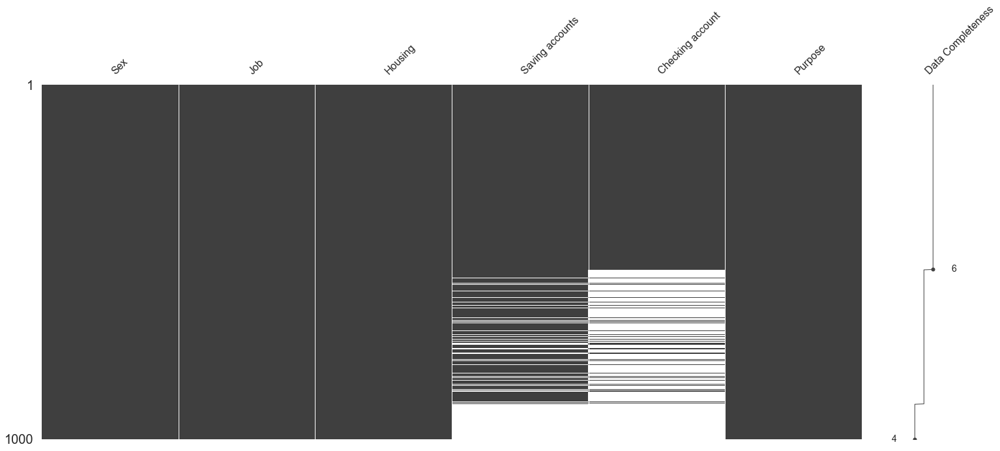

In [203]:
scan_miss_val(df[cat_columns])

In [204]:
hole_df = df[df[cat_columns].isnull().sum(axis=1)<2]
hole_df

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
0,67,male,2,own,NaN,little,1169,6,radio/TV
1,22,female,2,own,little,moderate,5951,48,radio/TV
2,49,male,1,own,little,NaN,2096,12,education
3,45,male,2,free,little,little,7882,42,furniture/equipment
4,53,male,2,free,little,little,4870,24,car
...,...,...,...,...,...,...,...,...,...
995,31,female,1,own,little,NaN,1736,12,furniture/equipment
996,40,male,3,own,little,little,3857,30,car
997,38,male,2,own,little,NaN,804,12,radio/TV
998,23,male,2,free,little,little,1845,45,radio/TV


In [205]:
df_categoric = df[cat_columns].copy()
df_categoric['Saving accounts']  = df_categoric['Saving accounts'].apply(lambda x: 'Nan' if x is np.nan else x)
df_categoric['Checking account'] = df_categoric['Checking account'].apply(lambda x: 'Nan' if x is np.nan else x)

In [206]:
scan_miss_val(df_categoric)

,% miss,cnt
Sex,0,0
Job,0,0
Housing,0,0
Saving accounts,0,0
Checking account,0,0
Purpose,0,0


# <font color=#0b5bdb> 3. Preprocessing

 - Необходимо привести числовые признаки к единому масштабу, т.к. при уменьшении размерности и кластеризации необходимо расчитывать расстояния между объектами

In [207]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.base import BaseEstimator, TransformerMixin

In [208]:
class my_Scaler (TransformerMixin, BaseEstimator):
    
    def __init__(self, scaler_type='StandardScaler'):
        
        self.scaler_type = scaler_type
    
    def fit (self, X, y=None):
        
        if self.scaler_type == 'StandardScaler':
            self.scaler = StandardScaler()
            self.scaler.fit(X)
            return self
        if self.scaler_type == 'MinMaxScaler':
            self.scaler = MinMaxScaler(feature_range=(2, 3))
            self.scaler.fit(X)
            return self
        if self.scaler_type == 'pass':
            return self
        
    def transform (self, X, y=None):
        if self.scaler_type == 'pass':
            return X
        else:
            X = self.scaler.transform(X)
            X = pd.DataFrame(X, columns=self.scaler.get_feature_names_out())
            return X

In [209]:
from sklearn import preprocessing
import category_encoders as ce

class my_Encoder (TransformerMixin, BaseEstimator):
    
    '''
    my_Encoder()
    fit (self, X, y=None)
    transform (self, X, y=None)
    '''
    def __init__(self, mode='OHE'):
        
        self.mode = mode
        
        
    def fit (self, X, y=None):
        
        if self.mode == 'OHE':
            self.OHE = preprocessing.OneHotEncoder(#drop='first'
                                                  )
            self.OHE.fit(X)
            return self
        
        if self.mode == 'WOE':
            self.WOE = ce.WOEEncoder()
            self.WOE.fit(X,y)
            return self
    
    
    def transform (self, X, y=None):
        
        if self.mode == 'OHE':
            X = self.OHE.transform(X).toarray()
            X = pd.DataFrame(X, columns=self.OHE.get_feature_names_out())
            return X
        
        if self.mode == 'WOE':
            X = self.WOE.transform(X,y).add_suffix('_woe')
            return X

In [210]:
def make_num_prep (X_num):

    plt.figure(figsize=(10,5))
    sns.boxplot(data=X_num, orient='h')

    numeric_pipe = Pipeline(steps=[
        ('Scaler', my_Scaler(scaler_type='StandardScaler')),
    ])

    X_num_tr = numeric_pipe.fit_transform(X_num)

    plt.figure(figsize=(10,5))
    sns.boxplot(data=X_num_tr, orient='h')
    
    plt.show()
    
    return X_num_tr

In [211]:
def make_cat_prep(X_cat):

    categoric_pipe = Pipeline(steps=[
        ('Encoder', my_Encoder(mode='OHE'))
    ])

    X_cat_tr = categoric_pipe.fit_transform(X_cat)
    display(X_cat_tr.astype(str).describe())
    
    return X_cat_tr

In [213]:
def make_prep():
    
    X = pd.concat([df_num_norm], axis=1)
    
    num_columns = ['Age', 'Duration', 'Credit amount']
    
    X_num = X[num_columns]
    X_tr = make_num_prep(X_num)
    
    display(X_tr.head())
    
    return X_tr.copy()

# <font color=#0b5bdb> 4. Уменьшение размерности

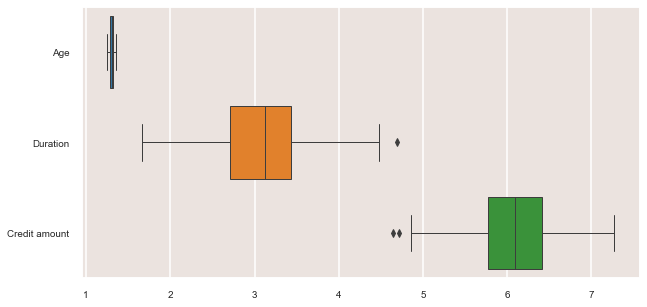

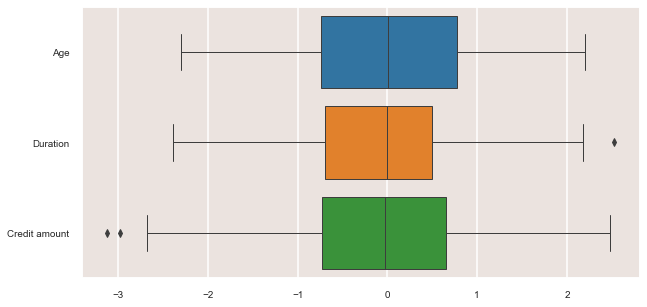

,Age,Duration,Credit amount
0,1.966313,-1.797419,-0.932701
1,-1.607482,1.764587,1.156805
2,1.211497,-0.694530,-0.157831
3,0.977107,1.516606,1.496009
4,1.415985,0.500910,0.911056


In [214]:
X_tr = make_prep()

### <font color=#0b5bdb> __PCA

In [215]:
from sklearn.decomposition import PCA

def plot_PCA_Explorer (X_scaled, n_components=None):
    pca = PCA(n_components)
    temp = pca.fit_transform(X_scaled)
    
    plt.figure(figsize=(10,10))
    
    exp_var = pca.explained_variance_ratio_ * 100
    cum_exp_var = np.cumsum(exp_var)

    plt.bar(list(range(1, len(pca.get_feature_names_out())+1)), exp_var, align='center', label='Individual explained variance')
    plt.step(list(range(1, len(pca.get_feature_names_out())+1)), cum_exp_var, label='Inqdividual explained variance', linewidth=3, color='red')
    plt.xticks(ticks=list(range(1, len(pca.get_feature_names_out())+1)))
    plt.yticks(ticks=list(range(10, 105, 5)))

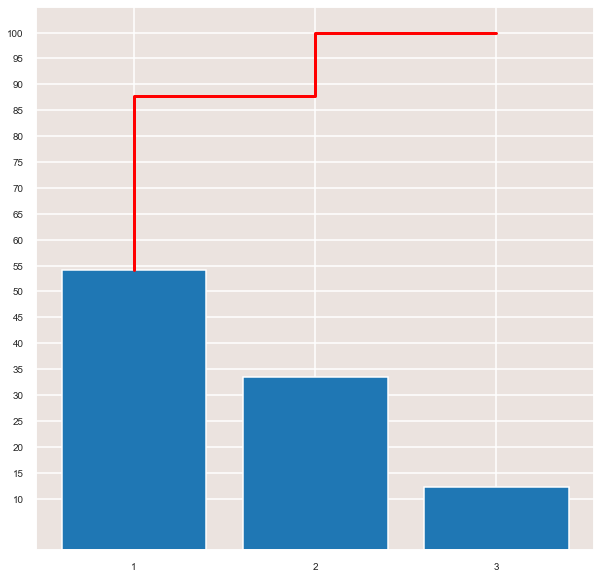

In [216]:
plot_PCA_Explorer(X_tr)

In [217]:
def PCA_transformation(X:pd.DataFrame, n_components: int):
    df_local = X.copy()
    
    PCA_local = PCA(n_components=n_components)
    df_local = PCA_local.fit_transform(df_local)
    df_local = pd.DataFrame(df_local, columns=PCA_local.get_feature_names_out())
    df_local.head()
    
    return df_local

In [218]:
X_tr_PCA = PCA_transformation(X_tr, n_components=3)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 10.34it/s]


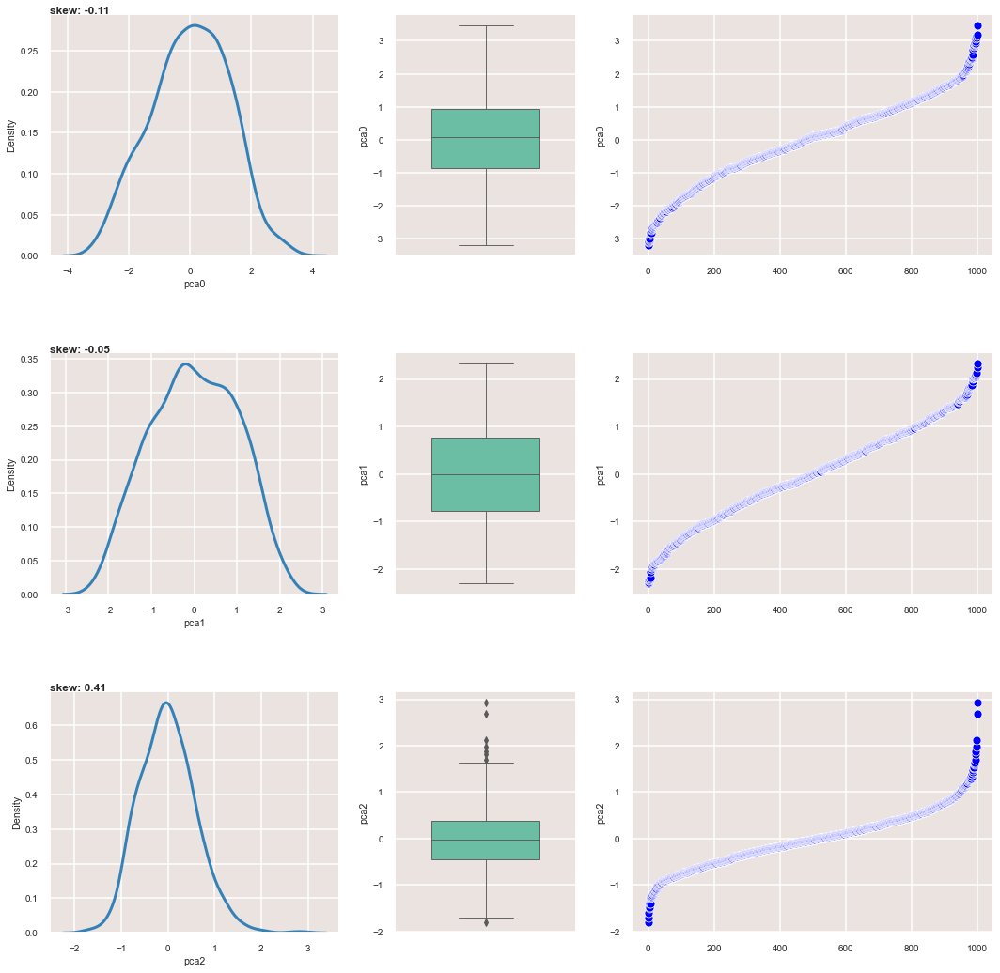

In [219]:
plot_numUFA(X_tr_PCA, num_columns=list(X_tr_PCA.columns))

<AxesSubplot:>

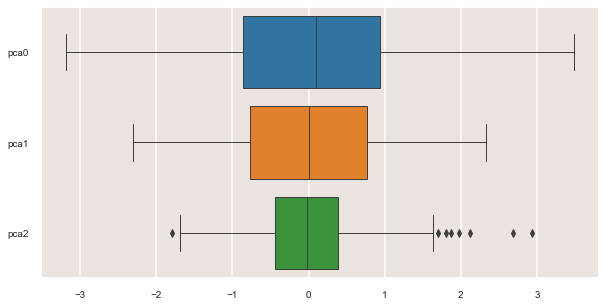

In [220]:
plt.figure(figsize=(10,5))
sns.boxplot(data=X_tr_PCA, orient='h')

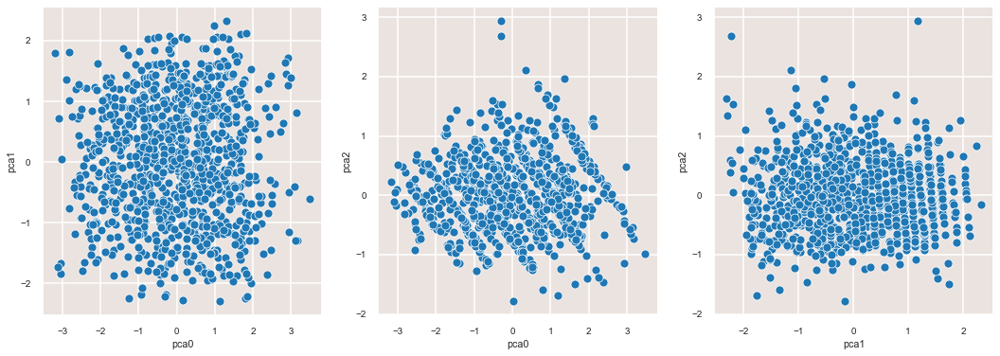

In [221]:
my_pairplot(X_tr_PCA)

***Анализ результатов***
 - Ввиду отсутствия сильной линейной корреляции между признаками, PCA не показал значительных результатов

### <font color=#0b5bdb> __TSNE

<font color=#0b5bdb> Расчет производится для разных значений perplexity

In [222]:
from sklearn.manifold import TSNE

In [223]:
def get_TSNE_DimRed (X, perplexity_list: list = None):

    TSNE_dict = {}
    
    if perplexity_list is None:
        perplexity_list = [10*i for i in range(1,10)]
    
    for i in perplexity_list:
        tsne = TSNE(
            n_components=2,
            perplexity=i
        )
        TSNE_dict[i] = pd.DataFrame(tsne.fit_transform(X), columns=['TSNE_1', 'TSNE_2'])
        
    return TSNE_dict

In [224]:
def plot_DimRed (DimRed_dict, target: pd.Series=None):
                
    figure, axes = my_subplots(subplot_cnt=len(DimRed_dict.keys()))

    for idx, key in enumerate (list(DimRed_dict.keys())):
        if idx < len(DimRed_dict.keys()):
            ax = axes[idx]
            DimRed_transformed = DimRed_dict[key].values
            sns.scatterplot(x= DimRed_transformed[:, 0], y = DimRed_transformed[:, 1], hue=target, 
                            ax=ax, palette='Set2')
            ax.set_title(str(key))

In [225]:
TSNE_dict = get_TSNE_DimRed(X_tr)

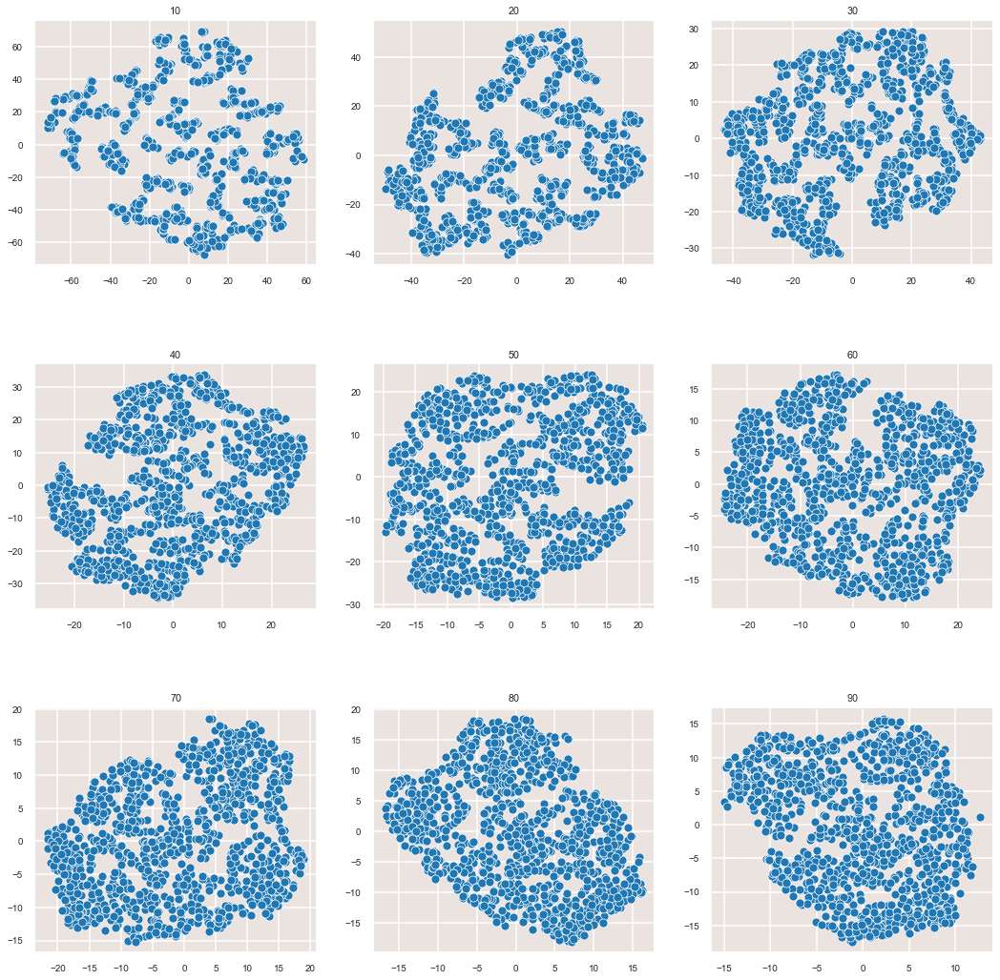

In [226]:
plot_DimRed(TSNE_dict)

### <font color=#0b5bdb> __UMAP

In [227]:
import umap

In [228]:
def get_UMAP_DimRed (X, n_neighbors_list: list = None):

    UMAP_dict = {}
    reducer = umap.UMAP()
    
    if n_neighbors_list is None:
        n_neighbors_list = [i for i in range(2,20,2)]
    
    for i in n_neighbors_list:
        reducer = umap.UMAP(n_neighbors=i)
        UMAP_dict[i] = pd.DataFrame(reducer.fit_transform(X), columns=['UMAP_1', 'UMAP_2'])
        
    return UMAP_dict

In [229]:
UMAP_dict = get_UMAP_DimRed(X_tr, n_neighbors_list=[2,4,8, 10, 12, 14, 16, 18, 20])

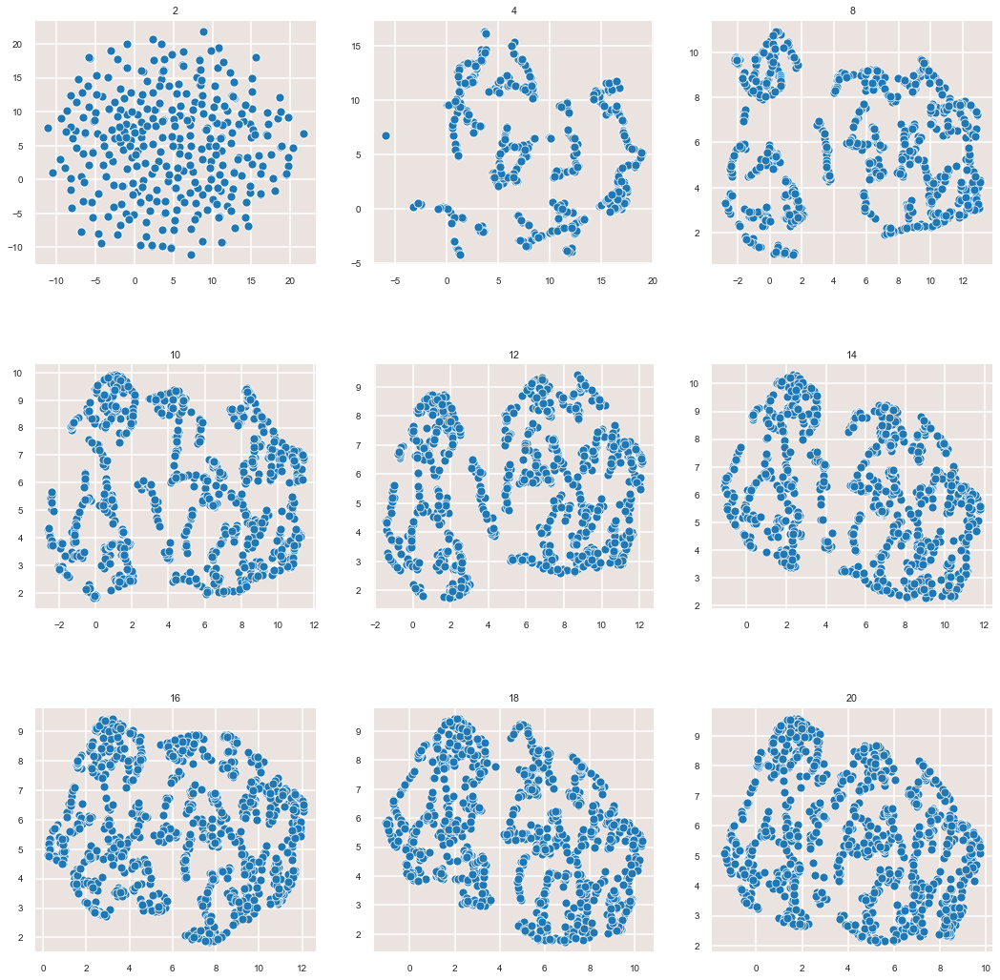

In [230]:
plot_DimRed(UMAP_dict)

# <font color=#0b5bdb> 5. Кластеризация

## <font color=#0b5bdb> Подготовка данных

In [231]:
from sklearn import metrics
from sklearn.metrics import silhouette_score

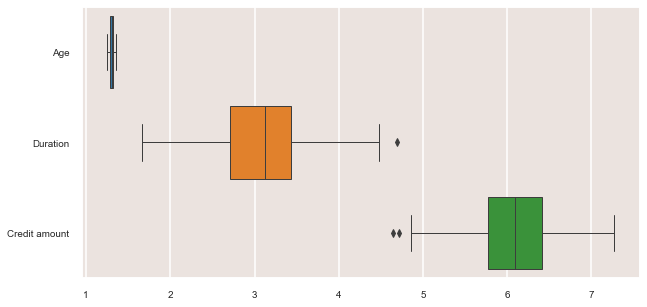

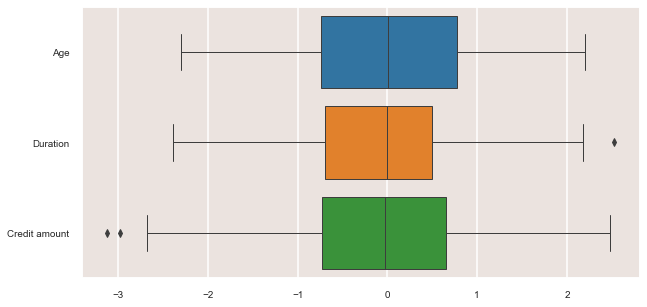

,Age,Duration,Credit amount
0,1.966313,-1.797419,-0.932701
1,-1.607482,1.764587,1.156805
2,1.211497,-0.694530,-0.157831
3,0.977107,1.516606,1.496009
4,1.415985,0.500910,0.911056


In [232]:
X_tr = make_prep()

### <font color=#0b5bdb> ___k-means

In [233]:
from sklearn.cluster import KMeans

def plot_Kmeans_explore(X):
    
    inertia = []
    k_1 = range(1, 30)
    for k_i in k_1:
        km = KMeans(n_clusters=k_i).fit(X)
        inertia.append(km.inertia_)
        
    silhouette = []
    k_2 = range(2, 20)
    for k_i in k_2:
        km = KMeans(n_clusters=k_i).fit(X_tr)
        km.fit(X_tr)
        silhouette.append(silhouette_score(X_tr, km.labels_))

    
    figure, axes = my_subplots(subplot_cnt=2)
    
    sns.lineplot(x=k_1, y=inertia, linewidth=3, 
                palette = 'Set2', marker='o', ax=axes[0])
    
    axes[0].title.set_text(f'**inertia**')
    axes[0].title.set_fontweight('bold')
    axes[0].title.set_fontsize(16)
    axes[0].set_xticks(ticks=list(range(2, 30)))
    #plt.show()
    
    sns.lineplot(x=k_2, y=silhouette, linewidth=3, 
                        palette = 'Set2', marker='o', ax=axes[1])
    
    axes[1].title.set_text(f'**silhouette**')
    axes[1].title.set_fontweight('bold')
    axes[1].title.set_fontsize(16)
    axes[1].set_xticks(ticks=list(range(2, 20)))
    plt.show()

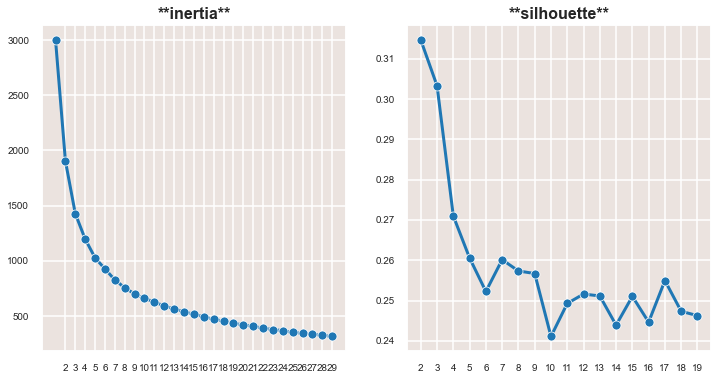

In [234]:
plot_Kmeans_explore(X_tr)

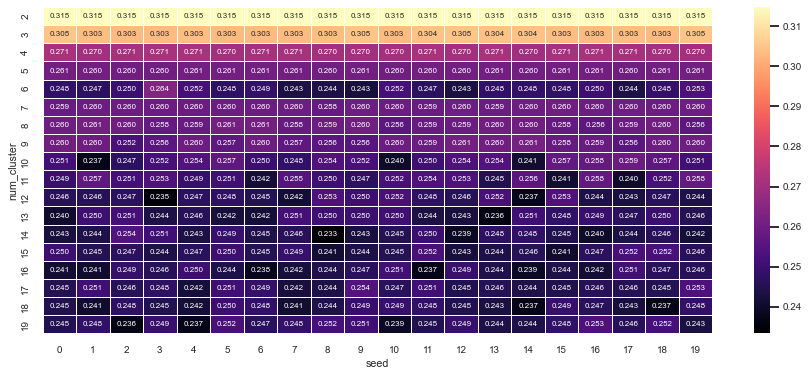

In [235]:
num_df_scaled = X_tr
results = []

for i in range(2,20):
    for r in range(20):
        kmeans = KMeans(n_clusters=i, random_state=r)
        c_labels = kmeans.fit_predict(num_df_scaled)
        sil_ave = silhouette_score(num_df_scaled, c_labels)
        results.append([i, r, sil_ave])
        
res_df = pd.DataFrame(results, columns=['num_cluster', 'seed', 'sil_score'])
pivot_kmeans = pd.pivot_table(res_df, index='num_cluster', columns='seed', values='sil_score')

plt.figure(figsize=(15,6))
plt.tight_layout
sns.heatmap(pivot_kmeans, annot=True, linewidths=0.5, fmt='.3f', cmap='magma', annot_kws={"size":8});

#### <font color=#0b5bdb> ___2 clasters

In [236]:
km = KMeans(n_clusters=2, random_state=0)
clusters = km.fit_predict(X_tr)
display(pd.DataFrame(clusters).value_counts(normalize=True))

1    0.536
0    0.464
dtype: float64

<font color=#0b5bdb> Посмотрим на класстеры по TSNE 

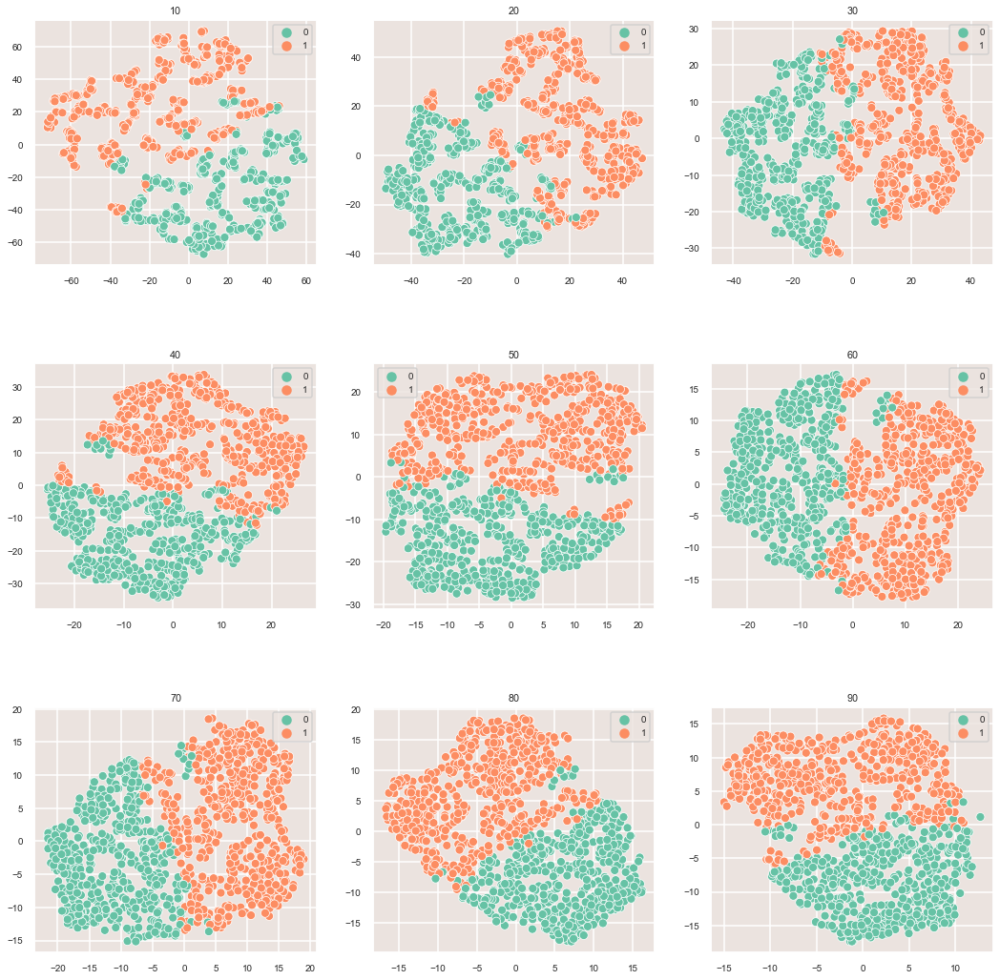

In [237]:
plot_DimRed(TSNE_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на класстеры по UMAP 

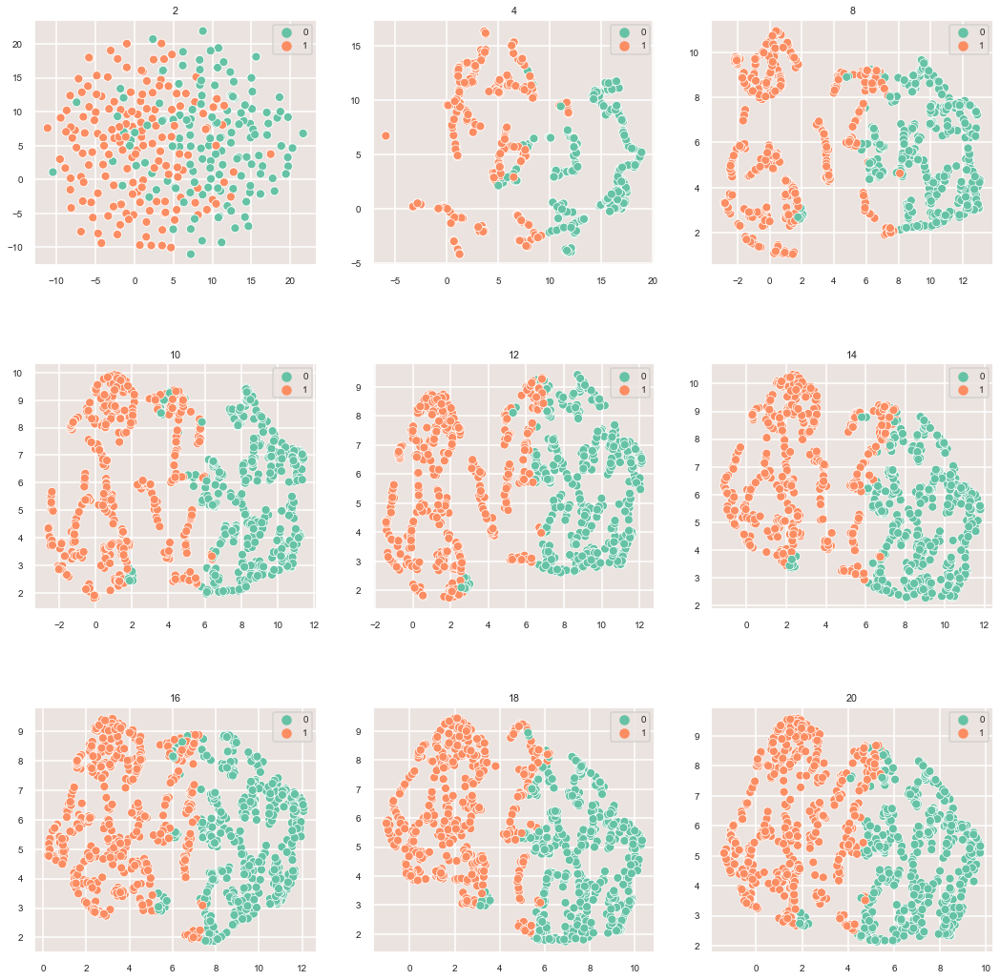

In [238]:
plot_DimRed(UMAP_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на статистики полученных класстеров


Баланс кластеров:


1    0.54
0    0.46
dtype: float64

labels,0,1
Age,35.44,35.64
Credit amount,5216.53,1587.29
Duration,30.02,13.01


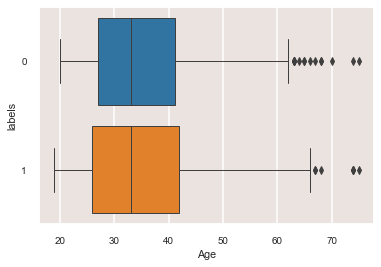

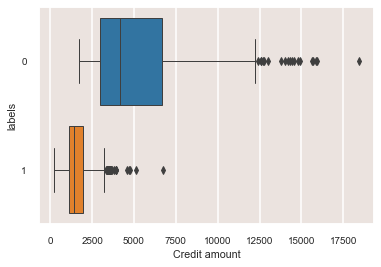

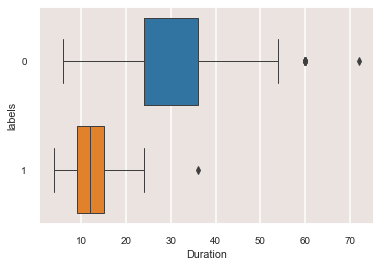

In [239]:
data = df[numeric_cols].copy()
print(f'\nБаланс кластеров:')
display(pd.DataFrame(clusters).value_counts(normalize=True).round(2))
data['labels'] = clusters
data_grouped = data.groupby('labels').mean()
display(data_grouped.T.round(2))


for col in data.drop(columns=['labels']).columns:
    sns.boxplot(data=data, x=data[col], y=data['labels'], orient='h')
    plt.show();

#### <font color=#0b5bdb> ___3 clasters

In [240]:
km = KMeans(n_clusters=3, random_state=0)
clusters = km.fit_predict(X_tr)
display(pd.DataFrame(clusters).value_counts(normalize=True))

1    0.379
0    0.322
2    0.299
dtype: float64

<font color=#0b5bdb> Посмотрим на класстеры по TSNE 

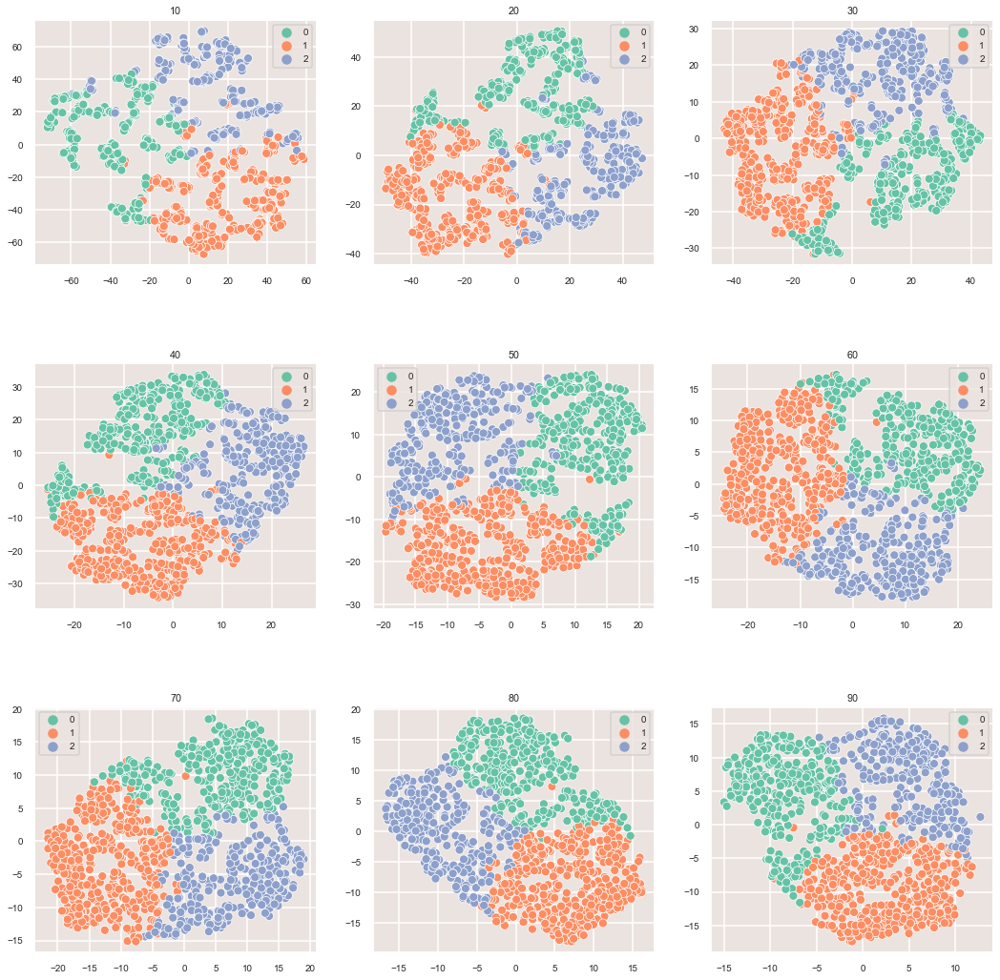

In [241]:
plot_DimRed(TSNE_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на класстеры по UMAP

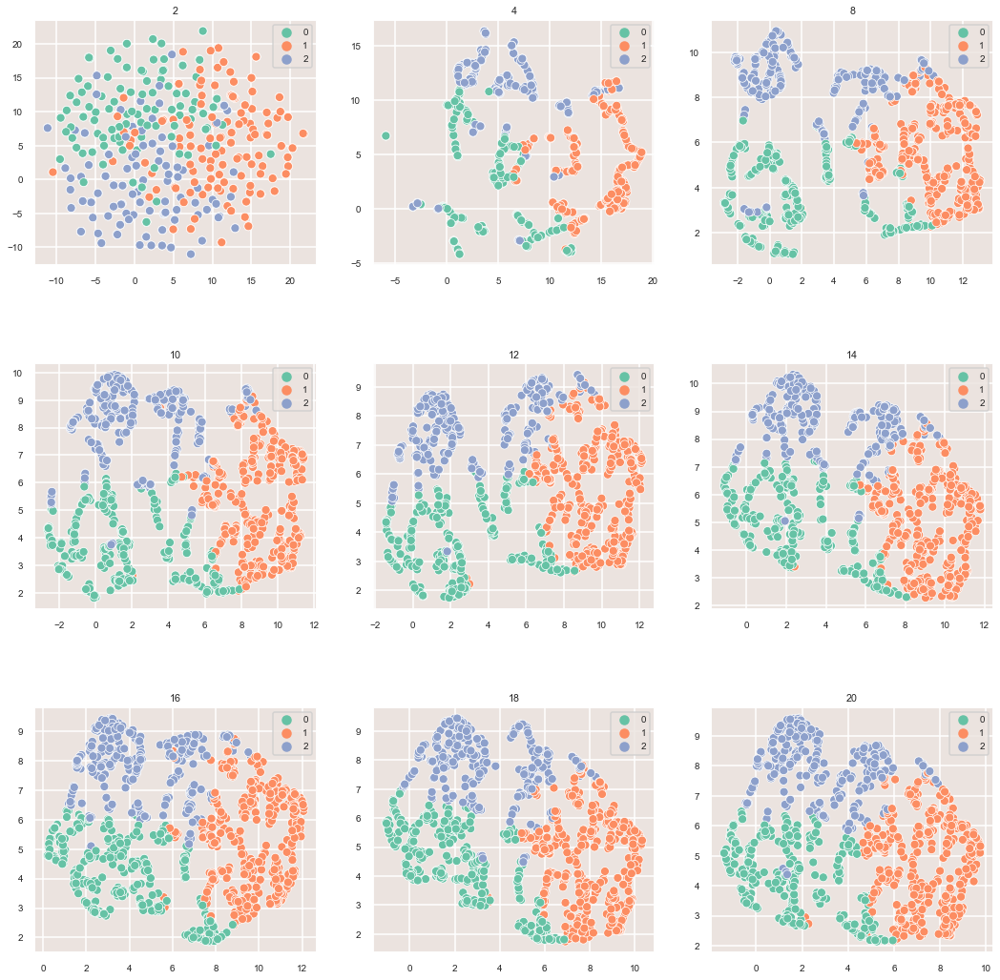

In [242]:
plot_DimRed(UMAP_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на статистики полученных класстеров


Баланс кластеров:


1    0.38
0    0.32
2    0.30
dtype: float64

labels,0,1,2
Age,45.65,34.52,25.97
Credit amount,1928.98,5622.69,1736.21
Duration,13.64,32.08,14.56


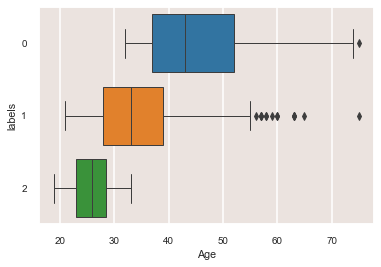

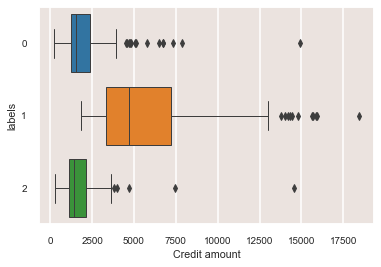

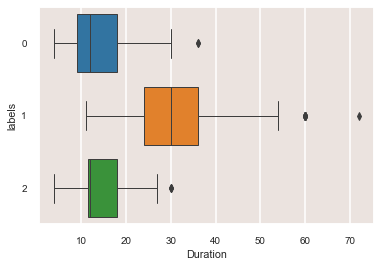

In [243]:
data = df[numeric_cols].copy()
print(f'\nБаланс кластеров:')
display(pd.DataFrame(clusters).value_counts(normalize=True).round(2))
data['labels'] = clusters
data_grouped = data.groupby('labels').mean()
display(data_grouped.T.round(2))


for col in data.drop(columns=['labels']).columns:
    sns.boxplot(data=data, x=data[col], y=data['labels'], orient='h')
    plt.show();

## <font color=#0b5bdb> 4.2 Иерархическая кластеризация

In [244]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.cluster.hierarchy import fcluster

from sklearn.metrics import silhouette_score
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist

def hierarchy_clustering_explorer (X_scaled):

    distance_mat = pdist(X_scaled) # pdist посчитает нам верхний треугольник матрицы попарных расстояний
    Z = hierarchy.linkage(distance_mat, 'ward') # linkage — реализация агломеративного алгоритма    
    
    
    
    silhouette = []
    MAX_CLUSTERS = 20
    k_2 = range(2, MAX_CLUSTERS+1)
    for k_i in k_2:
        clusters = fcluster(Z, k_i, criterion='maxclust')
        silhouette.append(silhouette_score(X_scaled, clusters))
    
    

    figure, axes = my_subplots(subplot_cnt=2)

    sns.lineplot(x=k_2, y=silhouette, linewidth=3, 
                        palette = 'Set2', marker='o', ax=axes[0])
    
    axes[0].title.set_text(f'**silhouette**')
    axes[0].title.set_fontweight('bold')
    axes[0].title.set_fontsize(16)
    axes[0].set_xticks(ticks=list(range(2, MAX_CLUSTERS+1)))

    # выводим размеры кластеров
    axes[1].set_title('Hierarchical Clustering Dendrogram (truncated)')
    axes[1].set_xlabel('sample index or (cluster size)', fontsize=15)
    axes[1].set_ylabel('distance', fontsize=15)
    plt.yticks(fontsize=15)

    hierarchy.dendrogram(
        Z,
        truncate_mode='lastp',  # show only the last p merged clusters
        p=12,                   # show only the last p merged clusters
        leaf_rotation=45.,
        color_threshold=2,
        leaf_font_size=15.,
        show_leaf_counts = True,
        show_contracted=False,   # to get a distribution impression in truncated branches
        ax=axes[1],
    )
    plt.show()

<font color=#0b5bdb> Посмотрим оценки возможного количества кластеров в данных

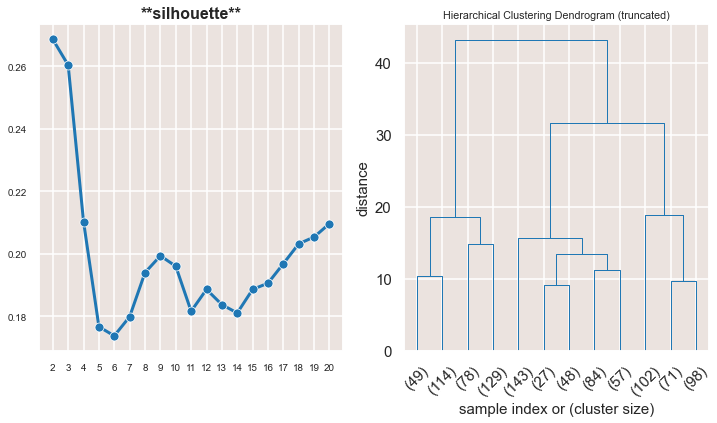

In [245]:
hierarchy_clustering_explorer (X_tr)

In [246]:
from scipy.cluster.hierarchy import fcluster

distance_mat = pdist(X_tr) # pdist посчитает нам верхний треугольник матрицы попарных расстояний
Z = hierarchy.linkage(distance_mat, 'ward') # linkage — реализация агломеративного алгоритма    

k=2
clusters = fcluster(Z, k, criterion='maxclust')

clusters = pd.Series(clusters, name='cat')
pd.DataFrame(clusters.value_counts(normalize=True).values, columns=['clusters %'])*100

,clusters %
0,63.0
1,37.0


<font color=#0b5bdb> Посмотрим на класстеры по TSNE

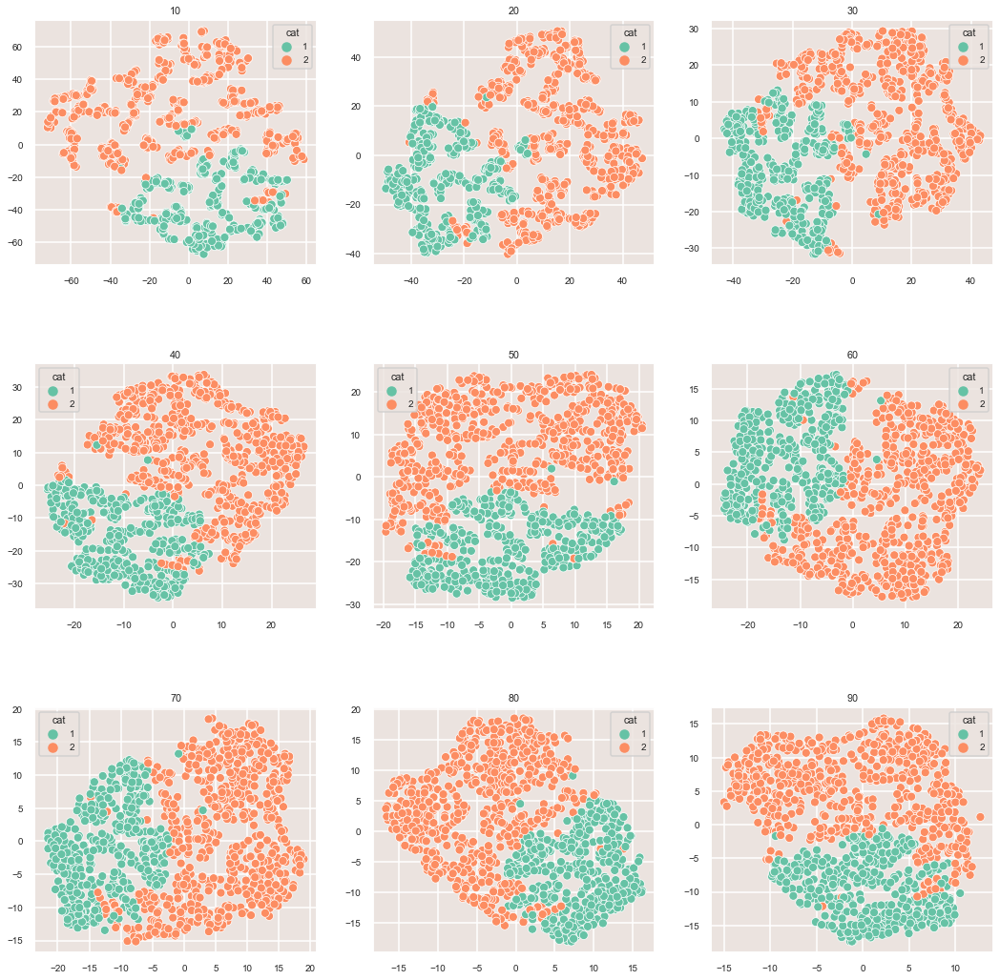

In [247]:
plot_DimRed(TSNE_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на класстеры по UMAP

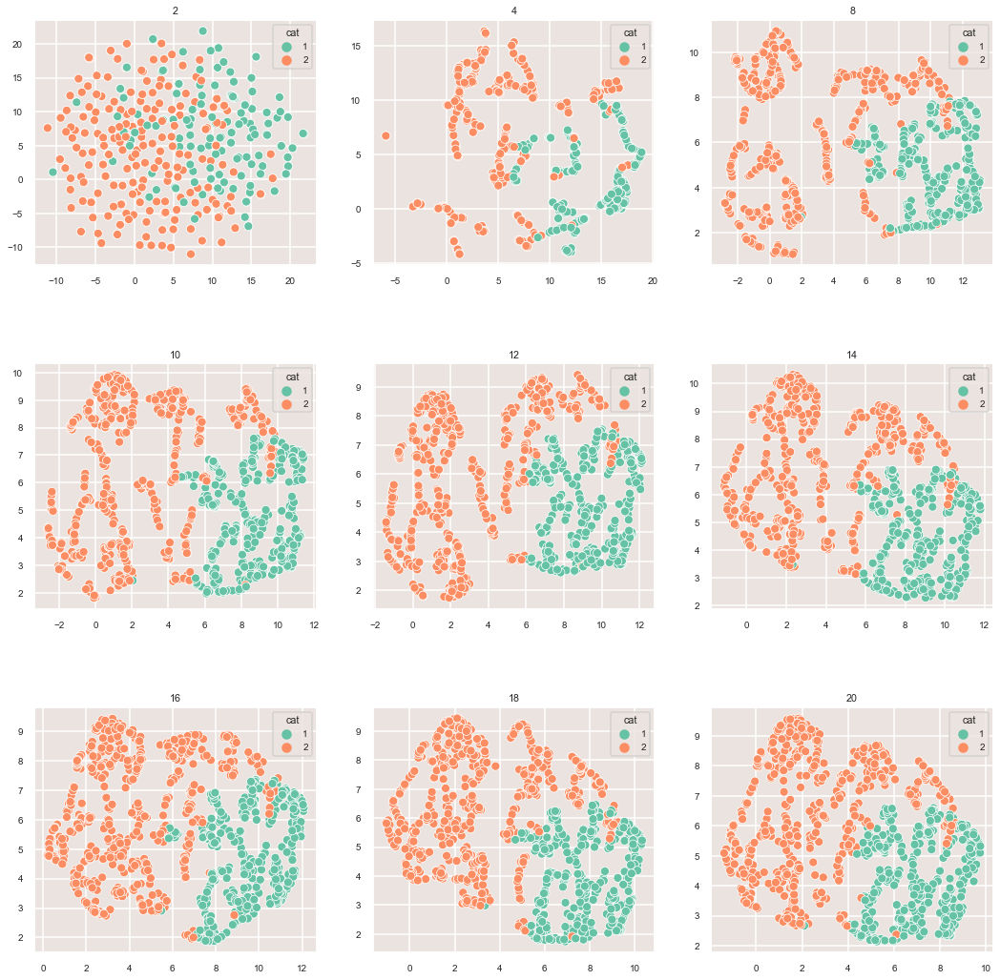

In [248]:
plot_DimRed(UMAP_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на статистики полученных класстеров


Баланс кластеров:


cat
2      0.63
1      0.37
dtype: float64

labels,1,2
Age,37.79,34.23
Credit amount,5500.78,1961.86
Duration,31.51,14.67


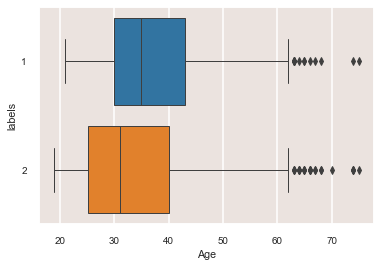

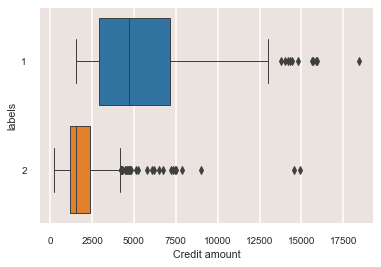

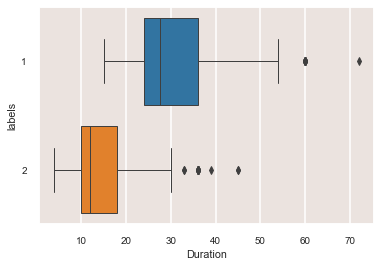

In [249]:
data = df[numeric_cols].copy()
print(f'\nБаланс кластеров:')
display(pd.DataFrame(clusters).value_counts(normalize=True).round(2))
data['labels'] = clusters
data_grouped = data.groupby('labels').mean()
display(data_grouped.T.round(2))


for col in data.drop(columns=['labels']).columns:
    sns.boxplot(data=data, x=data[col], y=data['labels'], orient='h')
    plt.show();

## <font color=#0b5bdb> 4.3 DBSCAN

In [250]:
from sklearn.cluster import DBSCAN

In [251]:
def dbscan_clustering(eps_range, X, min_samples=5):
    eps_range = eps_range
    silhouette = []
    clusters = []
    noise = []
    for i in tqdm(eps_range):
        dbscan = DBSCAN(eps=i, min_samples=min_samples).fit(X)
        labels = dbscan.labels_
        uniq_labels = np.unique(labels)
        n_clusters = len(uniq_labels[uniq_labels != -1])
        
        if n_clusters > 1:
            score = silhouette_score(X, labels)
        else:
            score = 0
            
        silhouette.append(score)
        clusters.append(n_clusters)
        
        n_noise_ = list(labels).count(-1)
        percent = np.round((100*n_noise_/num_df_scaled.shape[0]), 0)
        noise.append(percent)
    
    
    fig, ax1 = plt.subplots(figsize=(30, 20))
    plt.yticks(fontsize=15)
    
    ax2 = ax1.twinx()
    ax3 = ax1.twinx()
    ax3.spines.right.set_position(("axes", 1.04))

    color = 'tab:red'
    ax1.plot(eps_range, silhouette, marker='o', color=color)
    ax1.set_xlabel('eps')
    ax1.set_ylabel('silhouette', color=color, fontsize=15)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_xticks(ticks=list(eps_range))

    color = 'tab:blue'
    ax2.plot(eps_range, noise, marker='o', color=color)
    ax2.set_ylabel('noise', color=color, fontsize=15)  
    ax2.tick_params(axis='y', labelcolor=color)

    color = 'tab:green'
    ax3.plot(eps_range, clusters, marker='o', color=color)
    ax3.set_ylabel('clusters', color=color, fontsize=15)  
    ax3.tick_params(axis='y', labelcolor=color)
    
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

### <font color=#0b5bdb> __Кластеризация

100%|██████████████████████████████████████████████████████████████████████████████████| 90/90 [00:04<00:00, 21.32it/s]


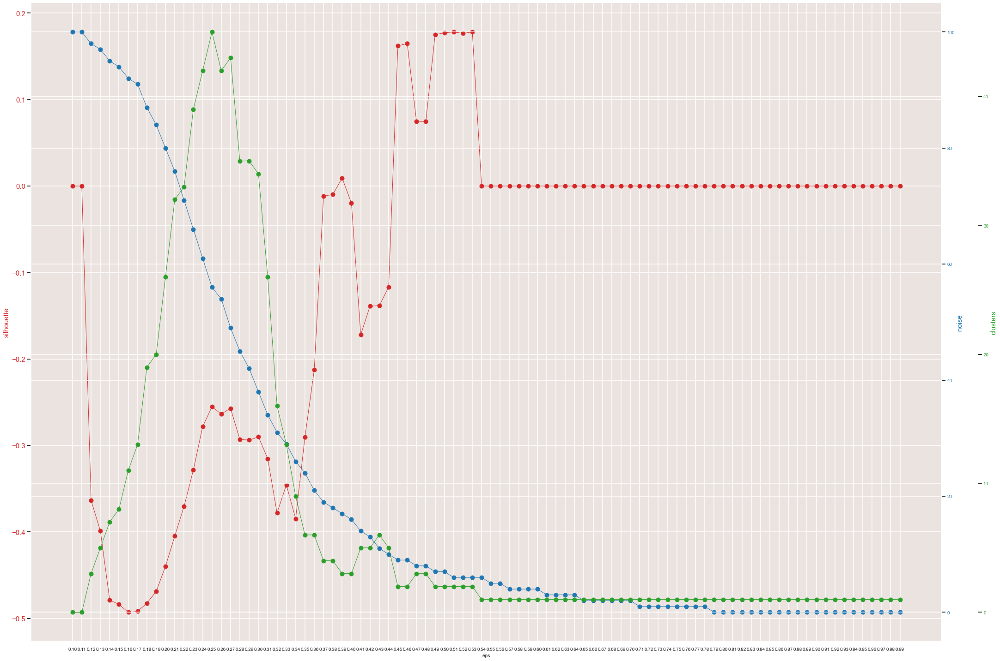

In [253]:
dbscan_clustering(eps_range=np.arange(0.1,1,0.01).round(2), X=X_tr, min_samples=5)

In [254]:
clusters = DBSCAN(eps=0.5, min_samples=5).fit_predict(X_tr)

<font color=#0b5bdb> Посмотрим на класстеры по TSNE

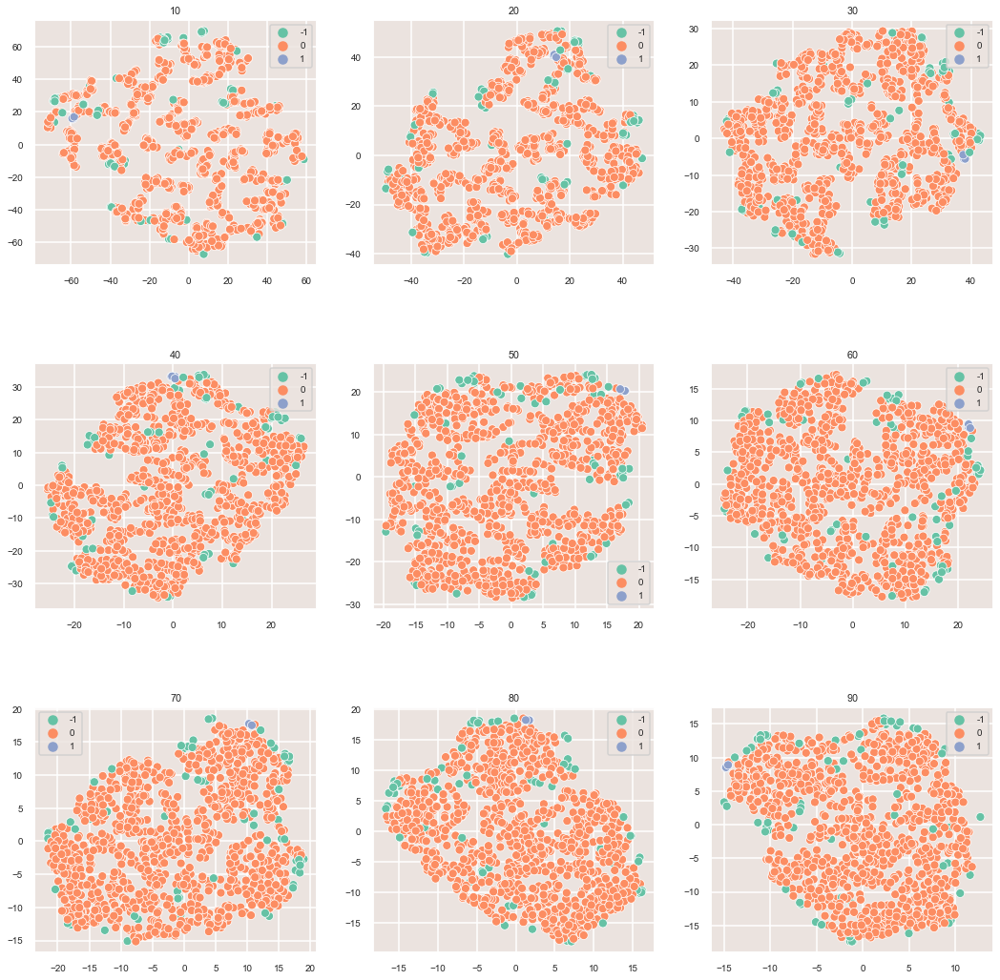

In [255]:
plot_DimRed(TSNE_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на класстеры по UMAP

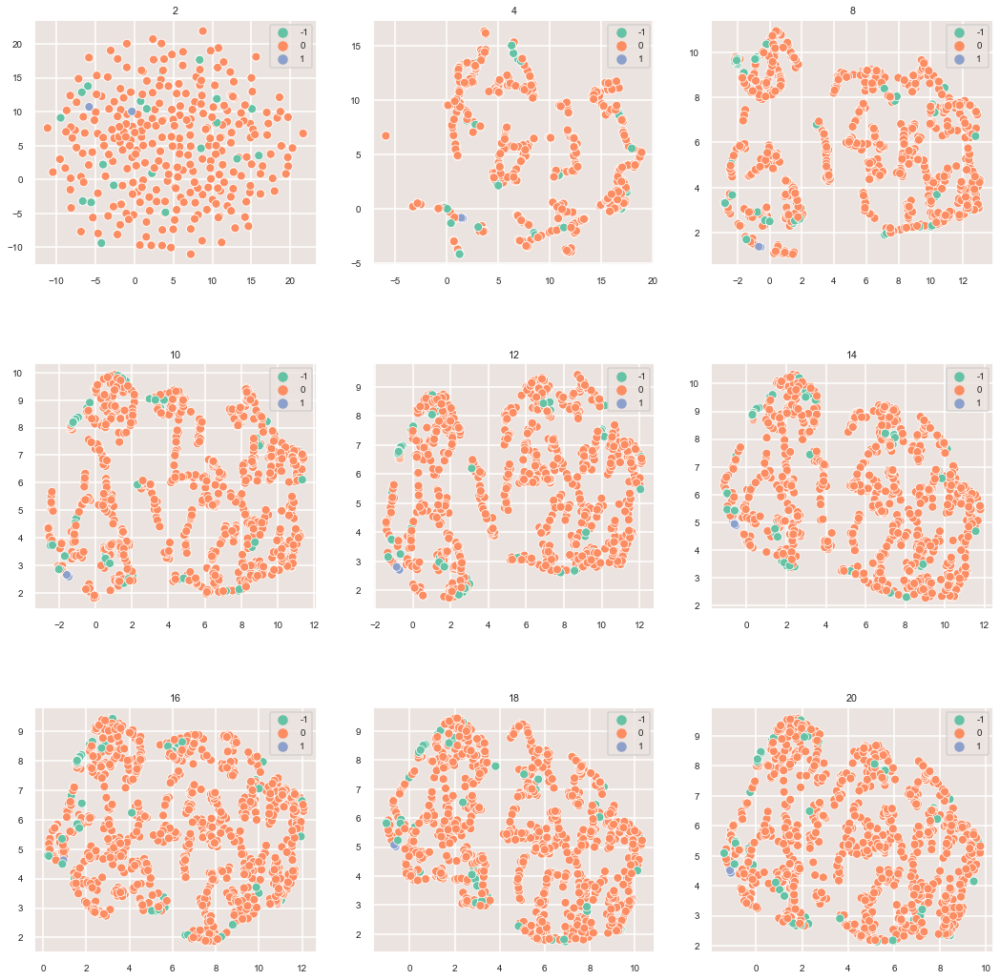

In [256]:
plot_DimRed(UMAP_dict, target=clusters)

<font color=#0b5bdb> Посмотрим на статистики полученных класстеров


Баланс кластеров:


 0    0.93
-1    0.07
 1    0.00
dtype: float64

labels,-1,0,1
Age,40.17,35.07,69.5
Credit amount,4656.62,3181.44,1295.0
Duration,16.65,21.27,6.0


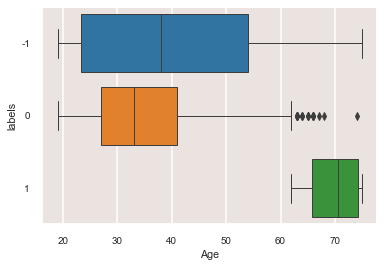

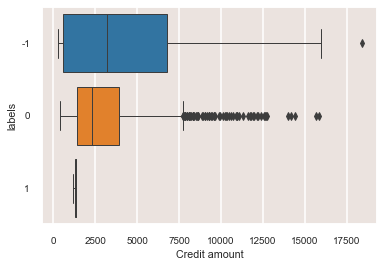

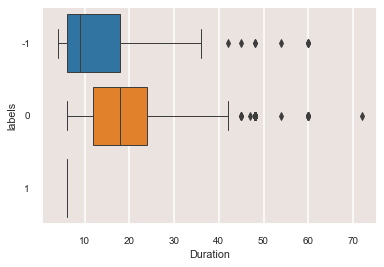

In [257]:
data = df[numeric_cols].copy()
print(f'\nБаланс кластеров:')
display(pd.DataFrame(clusters).value_counts(normalize=True).round(2))
data['labels'] = clusters
data_grouped = data.groupby('labels').mean()
display(data_grouped.T.round(2))

for col in data.drop(columns=['labels']).columns:
    sns.boxplot(data=data, x=data[col], y=data['labels'], orient='h')
    plt.show();

## <font color=#0b5bdb> Выводы кластеризации

***1. KNN***
 - Кластер 0 - клиенты среднего возраста с большой суммой кредита на длительный срок.
 - Кластер 1 - возрастные клиенты с малой суммой кредита (относительно кластера 0) с малым сроком.
 - Кластер 2 - клиенты среднего возраста с малой суммой кредита (относительно кластера 0) с малым сроком. 
 - ***На boxplots хорошо видно разделение по всем признакам.***
 
***2. Hierarchy***
 - Кластер 0 - клиенты среднего возраста с большой суммой кредита на длительный срок.
 - Кластер 1 - клиенты среднего возраста с малой суммой кредита (относительно кластера 0) с малым сроком.
 - ***На boxplots хорошо видно разделение по признакам Duration и Credit Amount.***
 
 
***3. DBSCAN***
 - Кластер 1 - Малый кластер клиентов старшего поколения.
 - Кластер 0 - Наибольший класс.
 - Кластер -1 (выбросы) - Клиенты среднего возраста с большой суммой кредита.
 - ***На boxplots хорошо видно разделение по признаку Age.***